# Tutorial 8 — From Regression Models to ANOVA

**Statistical Computation and Analysis — Spring 2026**

This tutorial uses `foodDiet_extended.csv` to organize regression model structures and connect them to ANOVA and explained-variance summaries.

Main goals:

1. Organize regression model structures: simple, multiple, categorical, additive, and interaction models.
2. Fit the same structures in a Bayesian framework using **Bambi**.
3. Fit the same structures in a frequentist framework using **OLS**.
4. Connect categorical regression models to **ANOVA-style sums of squares**.
5. Interpret explained-variance and effect-size summaries. In the frequentist section these include $R^2$, term-level partial $R^2$, $\eta^2$, and Cohen's $f$. In the Bayesian section these include Bayesian $R^2$, Bayesian term-level partial $R^2$, Bayesian $eta^2$, and Bayesian Cohen's $f$.

Important note: $R^2$ and related explained-variance summaries describe magnitude. They should **not** be used as the main tool for model comparison.

The dependent variable is:

$$
weight\_loss = weight\_before - weight\_after
$$

Positive values mean larger weight loss.

The tutorial is intentionally separated into:

1. Conceptual model map
2. Bayesian modeling with Bambi
3. Frequentist modeling with OLS and ANOVA-style summaries



## 1. Setup

The package versions match the course compatibility settings used in earlier tutorials.

Run this cell first. If packages are installed or changed, restart the runtime and run the notebook again from the beginning.

In [2]:

import sys
import subprocess
from importlib.metadata import version, PackageNotFoundError
from packaging.version import Version

IS_COLAB = "google.colab" in sys.modules

COURSE_PACKAGE_VERSIONS = {
    "arviz": "0.22.0",
    "matplotlib": "3.10.0",
    "numpy": "2.0.2",
    "pandas": "2.2.2",
    "pymc": "5.28.4",
    "scipy": "1.16.3",
    "seaborn": "0.13.2",
}

EXTRA_PACKAGES = {
    "bambi": None,
    "statsmodels": None,
    "preliz": None,
    "packaging": None,
}

packages_to_install = []

for package_name, required_version in COURSE_PACKAGE_VERSIONS.items():
    try:
        current_version = version(package_name)
        print(f"{package_name:10s}: {current_version}")
        if Version(current_version) != Version(required_version):
            packages_to_install.append(f"{package_name}=={required_version}")
    except PackageNotFoundError:
        packages_to_install.append(f"{package_name}=={required_version}")

for package_name in EXTRA_PACKAGES:
    try:
        current_version = version(package_name)
        print(f"{package_name:10s}: {current_version}")
    except PackageNotFoundError:
        packages_to_install.append(package_name)

if len(packages_to_install) > 0:
    print("Installing/updating packages:")
    for package in packages_to_install:
        print(" -", package)

    subprocess.check_call([
        sys.executable, "-m", "pip", "install", "-q", "--upgrade", *packages_to_install
    ])

    print("Packages were installed or changed.")
    print("Restart the runtime now, then run all cells again from the beginning.")
    raise SystemExit("Restart the runtime, then run all cells again from the beginning.")
else:
    print("All required course package versions are already installed.")

from pathlib import Path
import urllib.request
import warnings

import arviz as az
import bambi as bmb
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pymc as pm
import preliz as pz
import scipy
import scipy.stats as stats
import seaborn as sns
import statsmodels
import statsmodels.formula.api as smf
from statsmodels.stats.anova import anova_lm
from IPython.display import display

warnings.filterwarnings("ignore", category=FutureWarning)

print(f"arviz      : {az.__version__}")
print(f"matplotlib : {matplotlib.__version__}")
print(f"numpy      : {np.__version__}")
print(f"pandas     : {pd.__version__}")
print(f"pymc       : {pm.__version__}")
print(f"scipy      : {scipy.__version__}")
print(f"seaborn    : {sns.__version__}")
print(f"bambi      : {bmb.__version__}")
print(f"preliz     : {pz.__version__}")
print(f"statsmodels: {statsmodels.__version__}")

assert az.__version__ == "0.22.0"
assert matplotlib.__version__ == "3.10.0"
assert np.__version__ == "2.0.2"
assert pd.__version__ == "2.2.2"
assert pm.__version__ == "5.28.4"
assert scipy.__version__ == "1.16.3"
assert sns.__version__ == "0.13.2"

RANDOM_SEED = 17
rng = np.random.default_rng(RANDOM_SEED)
HDI_MASS = 0.94

az.style.use("arviz-whitegrid")
sns.set_context("notebook")
plt.rcParams["figure.dpi"] = 130
plt.rcParams["figure.figsize"] = (8, 5)
plt.rcParams["axes.spines.top"] = False
plt.rcParams["axes.spines.right"] = False

print("Colab detected:", IS_COLAB)

arviz     : 0.22.0
matplotlib: 3.10.0
numpy     : 2.0.2
pandas    : 2.2.2
pymc      : 5.28.4
scipy     : 1.16.3
seaborn   : 0.13.2
bambi     : 0.17.2
statsmodels: 0.14.6
preliz    : 0.24.0
packaging : 26.2
All required course package versions are already installed.
arviz      : 0.22.0
matplotlib : 3.10.0
numpy      : 2.0.2
pandas     : 2.2.2
pymc       : 5.28.4
scipy      : 1.16.3
seaborn    : 0.13.2
bambi      : 0.17.2
preliz     : 0.24.0
statsmodels: 0.14.6
Colab detected: True


## 2. Load the dataset

The notebook first searches for a local `foodDiet_extended.csv` file. If no file is found, it downloads the file from the course GitHub repository.

In [3]:

FOOD_DIET_URL = "https://raw.githubusercontent.com/opherdonchin/StatisticsCourse_36714361/main/Data/foodDiet_extended.csv"

SEARCH_FILENAMES = [
    "foodDiet_extended.csv",
    "FoodDiet_extended.csv",
    "food_diet_extended.csv",
    "foodDiet.csv",
]
SEARCH_DIRS = [Path("."), Path("data"), Path("Data"), Path("/content"), Path("/content/data")]


def find_local_food_diet_file():
    for directory in SEARCH_DIRS:
        for filename in SEARCH_FILENAMES:
            candidate = directory / filename
            if candidate.exists():
                return candidate
    return None


food_diet_path = find_local_food_diet_file()

if food_diet_path is None:
    print("No local foodDiet_extended file found. Downloading public CSV...")
    food_diet_path = Path("foodDiet_extended.csv")
    urllib.request.urlretrieve(FOOD_DIET_URL, food_diet_path)
else:
    print(f"Using local file: {food_diet_path}")

food_raw = pd.read_csv(food_diet_path)

print("Dataset shape:", food_raw.shape)
display(food_raw.head())
print("Columns:")
print(food_raw.columns.tolist())

Using local file: foodDiet_extended.csv
Dataset shape: (480, 7)


,Person,gender,Age,Height,pre.weight,Diet,weight6weeks
0,1,0,22,159,58.0,1,54.2
1,2,0,46,192,60.0,1,54.0
2,3,0,55,170,64.0,1,63.3
3,4,0,33,171,64.0,1,61.1
4,5,0,50,170,65.0,1,62.2


Columns:
['Person', 'gender', 'Age', 'Height', 'pre.weight', 'Diet', 'weight6weeks']


## 3. Clean and prepare variables

The code maps common possible column names to a standard set:

- `height`
- `age`
- `weight_before`
- `weight_after`
- `diet_type`
- `gender`

Then it creates:

```python
weight_loss = weight_before - weight_after
```

and standardized versions of the continuous predictors.

In [4]:

COLUMN_ALIASES = {
    "height": ["height", "Height", "height_cm", "Height_cm", "Height_cm_"],
    "age": ["age", "Age"],
    "weight_before": [
        "weight_before", "Weight_before", "pre_weight", "Pre_weight",
        "pre.weight", "Pre.weight", "weight_before_diet",
        "weight before diet", "Weight before diet"],
    "weight_after": [
        "weight_after", "Weight_after", "post_weight", "Post_weight",
        "post.weight", "Post.weight", "weight6weeks", "Weight6weeks",
        "weight_after_diet", "weight after diet", "Weight after diet"],
    "diet_type": [
        "diet_type", "Diet_type", "diet", "Diet", "diet.group", "Diet.group",
        "diet_group", "Diet_group"],
    "gender": ["gender", "Gender", "sex", "Sex"],
}


def find_column(dataframe, aliases):
    existing = set(dataframe.columns)
    for alias in aliases:
        if alias in existing:
            return alias

    normalized_columns = {str(col).strip().lower().replace(" ", "_"): col for col in dataframe.columns}
    for alias in aliases:
        key = str(alias).strip().lower().replace(" ", "_")
        if key in normalized_columns:
            return normalized_columns[key]
    return None


rename_map = {}
missing_standard_columns = []
for standard_name, aliases in COLUMN_ALIASES.items():
    original_column = find_column(food_raw, aliases)
    if original_column is None:
        missing_standard_columns.append(standard_name)
    else:
        rename_map[original_column] = standard_name

if len(missing_standard_columns) > 0:
    print("Could not automatically identify these required variables:")
    print(missing_standard_columns)
    print("Original columns:")
    print(food_raw.columns.tolist())
    raise ValueError("Update COLUMN_ALIASES so each required variable is mapped correctly.")

food = food_raw.rename(columns=rename_map).copy()
required_columns = ["height", "age", "weight_before", "weight_after", "diet_type", "gender"]
food = food.dropna(subset=required_columns).copy()

for column in ["height", "age", "weight_before", "weight_after"]:
    food[column] = pd.to_numeric(food[column], errors="coerce")
food = food.dropna(subset=required_columns).copy()

food["diet_type"] = food["diet_type"].astype(str).str.strip()
food["gender"] = food["gender"].astype(str).str.strip()

# Code gender using labels instead of numeric 0/1 values.
# In this dataset, 0 is coded as F and 1 is coded as M.
gender_label_map = {
    "0": "F",
    "0.0": "F",
    "F": "F",
    "f": "F",
    "female": "F",
    "Female": "F",
    "1": "M",
    "1.0": "M",
    "M": "M",
    "m": "M",
    "male": "M",
    "Male": "M",
}
food["gender"] = food["gender"].replace(gender_label_map)

food["diet_type"] = pd.Categorical(food["diet_type"], categories=sorted(food["diet_type"].unique()), ordered=True)
if set(food["gender"].unique()).issubset({"F", "M"}):
    food["gender"] = pd.Categorical(food["gender"], categories=["F", "M"], ordered=True)
else:
    food["gender"] = pd.Categorical(food["gender"], categories=sorted(food["gender"].unique()), ordered=True)

food["weight_loss"] = food["weight_before"] - food["weight_after"]
food["age_z"] = (food["age"] - food["age"].mean()) / food["age"].std()
food["height_z"] = (food["height"] - food["height"].mean()) / food["height"].std()
food["weight_before_z"] = (food["weight_before"] - food["weight_before"].mean()) / food["weight_before"].std()
food = food.reset_index(drop=True)

analysis_columns = [
    "height", "height_z", "age", "age_z", "weight_before", "weight_after",
    "weight_loss", "diet_type", "gender"
]

display(food[analysis_columns].head())
print(f"Number of observations used: {len(food)}")
print("Diet type levels:", list(food["diet_type"].cat.categories))
print("Gender levels:", list(food["gender"].cat.categories))

,height,height_z,age,age_z,weight_before,weight_after,weight_loss,diet_type,gender
0,159,-1.107219,22,-1.891808,58.0,54.2,3.8,1,F
1,192,1.863872,46,0.724474,60.0,54.0,6.0,1,F
2,170,-0.116855,55,1.705579,64.0,63.3,0.7,1,F
3,171,-0.026822,33,-0.692679,64.0,61.1,2.9,1,F
4,170,-0.116855,50,1.160521,65.0,62.2,2.8,1,F


Number of observations used: 480
Diet type levels: ['1', '2', '3']
Gender levels: ['F', 'M']


## 4. Look at the data first

Main question:

> Which variables help explain weight loss?

Potential predictors:

- age
- height
- diet type
- gender

We mostly avoid using `weight_before` in the main teaching models because `weight_loss` is already constructed from `weight_before` and `weight_after`. It can be used as a scientifically relevant adjustment variable, but it requires a more careful interpretation.

,count,mean,std,min,25%,50%,75%,max
weight_loss,480.0,3.851,2.532,-7.5,2.2,3.80,5.500,13.1
age,480.0,39.354,9.173,16.0,34.0,40.00,45.000,65.0
height,480.0,171.298,11.107,141.0,164.0,170.00,177.000,205.0
weight_before,480.0,73.428,8.522,45.0,68.0,74.10,79.400,103.0
weight_after,480.0,69.577,8.619,40.0,63.6,70.55,76.325,103.0


Diet type counts


,count
diet_type,
1,160
2,160
3,160


Gender counts


,count
gender,
F,240
M,240


/tmp/ipykernel_46430/1776090990.py:26: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


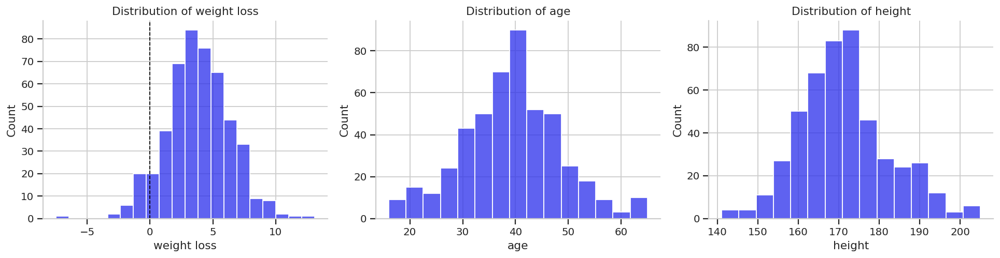

/tmp/ipykernel_46430/1776090990.py:40: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


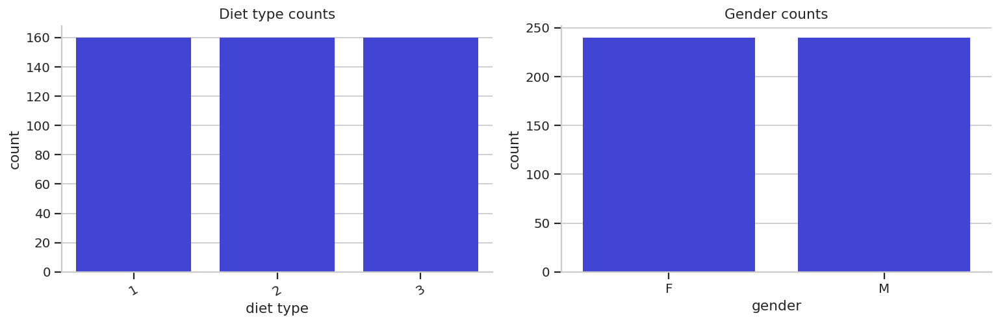

/tmp/ipykernel_46430/1776090990.py:58: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


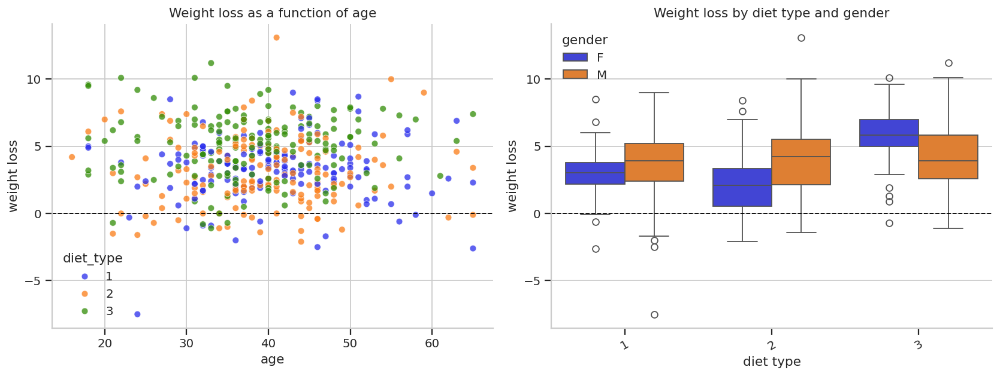

In [5]:

summary_table = food[["weight_loss", "age", "height", "weight_before", "weight_after"]].describe().T
summary_table = summary_table[["count", "mean", "std", "min", "25%", "50%", "75%", "max"]]
display(summary_table.round(3))

print("Diet type counts")
display(food["diet_type"].value_counts().sort_index().to_frame("count"))

print("Gender counts")
display(food["gender"].value_counts().sort_index().to_frame("count"))

fig, axes = plt.subplots(1, 3, figsize=(15, 4))

sns.histplot(food["weight_loss"], bins=20, ax=axes[0], edgecolor="white")
axes[0].axvline(0, color="black", linestyle="--", linewidth=1)
axes[0].set_title("Distribution of weight loss")
axes[0].set_xlabel("weight loss")

sns.histplot(food["age"], bins=15, ax=axes[1], edgecolor="white")
axes[1].set_title("Distribution of age")
axes[1].set_xlabel("age")

sns.histplot(food["height"], bins=15, ax=axes[2], edgecolor="white")
axes[2].set_title("Distribution of height")
axes[2].set_xlabel("height")

plt.tight_layout()
plt.show()

fig, axes = plt.subplots(1, 2, figsize=(12, 4))

sns.countplot(data=food, x="diet_type", ax=axes[0])
axes[0].set_title("Diet type counts")
axes[0].set_xlabel("diet type")
axes[0].tick_params(axis="x", rotation=30)

sns.countplot(data=food, x="gender", ax=axes[1])
axes[1].set_title("Gender counts")
axes[1].set_xlabel("gender")

plt.tight_layout()
plt.show()

fig, axes = plt.subplots(1, 2, figsize=(13, 5))

sns.scatterplot(data=food, x="age", y="weight_loss", hue="diet_type", ax=axes[0], alpha=0.75)
axes[0].axhline(0, color="black", linestyle="--", linewidth=1)
axes[0].set_title("Weight loss as a function of age")
axes[0].set_xlabel("age")
axes[0].set_ylabel("weight loss")

sns.boxplot(data=food, x="diet_type", y="weight_loss", hue="gender", ax=axes[1])
axes[1].axhline(0, color="black", linestyle="--", linewidth=1)
axes[1].set_title("Weight loss by diet type and gender")
axes[1].set_xlabel("diet type")
axes[1].set_ylabel("weight loss")
axes[1].tick_params(axis="x", rotation=30)

plt.tight_layout()
plt.show()

# Part A — Conceptual model map

All models in this tutorial use the same likelihood idea:

$$
weight\_loss_i \sim Normal(\mu_i, \sigma)
$$

The parameter $\mu_i$ is the expected weight loss for participant $i$.

The parameter $\sigma$ is the residual standard deviation: the amount of variation in weight loss that remains after the model prediction.

The models differ in how they define the expected value $\mu_i$.

All models include an intercept.

## 5. Coding model terms

Before writing the seven model equations, we define how different types of terms are represented.

### Continuous predictors

A continuous predictor enters the model with a slope parameter. For example, standardized age is represented as:

$$
\beta_{age} age^z_i
$$

where $\beta_{age}$ is the expected change in weight loss for a one-standard-deviation increase in age.

### Categorical predictors

A categorical predictor is represented using indicator variables.

One category is the reference category. The reference category is absorbed into the intercept.

For diet type, define indicator variables for all non-reference diet levels:

$$
D_{ik} = I(diet_i = d_k), \quad k = 2, \ldots, K
$$

where $d_1$ is the reference diet type.

For gender, the data are coded as `F` and `M`. In this notebook, `F` is the reference level and:

$$
M_i = I(gender_i = M)
$$

A categorical coefficient is interpreted as a difference from the reference category.

### Interaction terms

An interaction is represented by multiplying model terms.

The general idea is that the effect of one predictor is allowed to depend on another predictor.

A continuous-by-continuous interaction multiplies two continuous predictors:

$$
x_{1,i}x_{2,i}
$$

For example:

$$
age^z_i height^z_i
$$

This means that the slope of age could depend on height, and equivalently that the slope of height could depend on age. This interaction is introduced conceptually, but it is not one of the seven fitted models in this tutorial.

A continuous-by-categorical interaction multiplies a continuous predictor by a categorical indicator:

$$
age^z_i D_{ik}
$$

This means that the slope of age is allowed to differ by diet type.

A categorical-by-categorical interaction multiplies two categorical indicators:

$$
D_{ik}M_i
$$

This means that the diet effect is allowed to differ by gender.

## 6. Seven model structures

| Model | Model type | Formula | Teaching point |
|---|---|---|---|
| 1 | One continuous predictor | `weight_loss ~ age_z` | One slope: weight loss changes linearly with age |
| 2 | One categorical predictor | `weight_loss ~ diet_type` | Group means / one-way ANOVA-style model |
| 3 | Two continuous predictors | `weight_loss ~ age_z + height_z` | Adjusted slopes: each predictor is interpreted while holding the other fixed |
| 4 | Two categorical predictors | `weight_loss ~ diet_type + gender` | Additive group effects: diet and gender contribute separately |
| 5 | Continuous + categorical predictors | `weight_loss ~ age_z + diet_type` | Same age slope for all diet types, different intercepts by diet |
| 6 | Continuous × categorical interaction | `weight_loss ~ age_z * diet_type` | The age slope is allowed to differ by diet type |
| 7 | Categorical × categorical interaction | `weight_loss ~ diet_type * gender` | The diet effect is allowed to differ by gender |

All seven models use the same dependent variable:

```text
weight_loss = weight_before - weight_after
```

## 7. Model equations

The equations below use the coding definitions from the previous section.

### Model 1: one continuous predictor

$$
\mu_i = \beta_0 + \beta_{age} age^z_i
$$

### Model 2: one categorical predictor

$$
\mu_i = \beta_0 + \sum_{k=2}^{K}\beta_{diet,k}D_{ik}
$$

### Model 3: two continuous predictors

$$
\mu_i = \beta_0 + \beta_{age} age^z_i + \beta_{height} height^z_i
$$

### Model 4: two categorical predictors

$$
\mu_i = \beta_0 + \sum_{k=2}^{K}\beta_{diet,k}D_{ik} + \beta_M M_i
$$

This is an additive model: diet and gender contribute separately.

### Model 5: continuous + categorical predictors

$$
\mu_i = \beta_0 + \beta_{age} age^z_i + \sum_{k=2}^{K}\beta_{diet,k}D_{ik}
$$

This model allows different intercepts for different diet types, but assumes the same age slope for all diet types.

### Model 6: continuous by categorical interaction

$$
\mu_i =
\beta_0
+ \beta_{age} age^z_i
+ \sum_{k=2}^{K}\beta_{diet,k}D_{ik}
+ \sum_{k=2}^{K}\gamma_{age:diet,k}\,age^z_iD_{ik}
$$

This model allows the age slope to differ by diet type.

### Model 7: categorical by categorical interaction

$$
\mu_i =
\beta_0
+ \sum_{k=2}^{K}\beta_{diet,k}D_{ik}
+ \beta_M M_i
+ \sum_{k=2}^{K}\gamma_{diet:gender,k}\,D_{ik}M_i
$$

This model allows the diet effect to differ by gender.

In [6]:

model_map = pd.DataFrame({
    "model_name": [
        "one continuous",
        "one categorical",
        "continuous + continuous",
        "categorical + categorical",
        "continuous + categorical",
        "continuous * categorical",
        "categorical * categorical",
    ],
    "formula": [
        "weight_loss ~ age_z",
        "weight_loss ~ diet_type",
        "weight_loss ~ age_z + height_z",
        "weight_loss ~ diet_type + gender",
        "weight_loss ~ age_z + diet_type",
        "weight_loss ~ age_z * diet_type",
        "weight_loss ~ diet_type * gender",
    ],
    "interpretation": [
        "one slope for age",
        "mean differences between diet types",
        "age effect adjusted for height and height effect adjusted for age",
        "diet and gender effects without interaction",
        "same age slope for all diet types, different intercepts",
        "age slope may differ between diet types",
        "diet differences may depend on gender",
    ]
})

display(model_map)

,model_name,formula,interpretation
0,one continuous,weight_loss ~ age_z,one slope for age
1,one categorical,weight_loss ~ diet_type,mean differences between diet types
2,continuous + continuous,weight_loss ~ age_z + height_z,age effect adjusted for height and height effe...
3,categorical + categorical,weight_loss ~ diet_type + gender,diet and gender effects without interaction
4,continuous + categorical,weight_loss ~ age_z + diet_type,"same age slope for all diet types, different i..."
5,continuous * categorical,weight_loss ~ age_z * diet_type,age slope may differ between diet types
6,categorical * categorical,weight_loss ~ diet_type * gender,diet differences may depend on gender


## 8. Conceptual plots

These are descriptive plots. They are used to see the model structures before Bayesian or frequentist inference.

/tmp/ipykernel_46430/3435443791.py:17: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


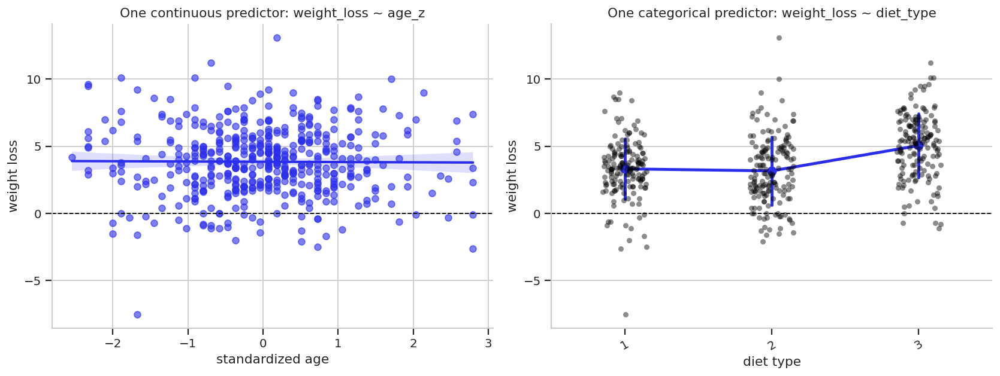

/tmp/ipykernel_46430/3435443791.py:36: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


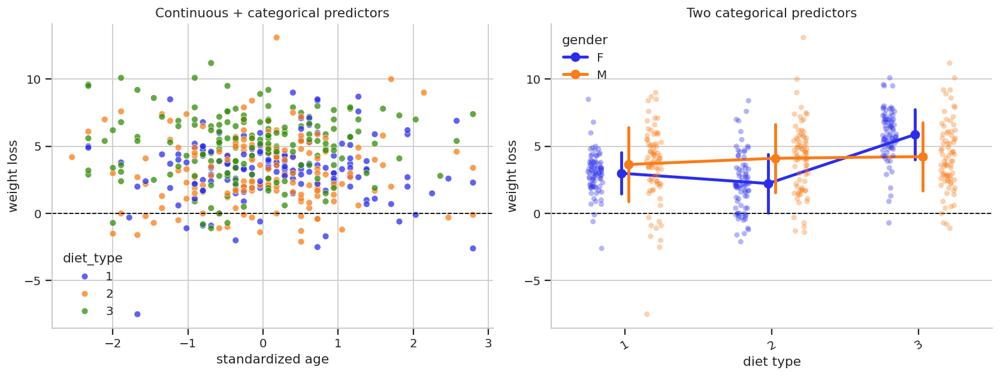

In [7]:

fig, axes = plt.subplots(1, 2, figsize=(13, 5))

sns.regplot(data=food, x="age_z", y="weight_loss", ax=axes[0], scatter_kws={"alpha": 0.6})
axes[0].axhline(0, color="black", linestyle="--", linewidth=1)
axes[0].set_title("One continuous predictor: weight_loss ~ age_z")
axes[0].set_xlabel("standardized age")
axes[0].set_ylabel("weight loss")

sns.pointplot(data=food, x="diet_type", y="weight_loss", ax=axes[1], errorbar="sd")
sns.stripplot(data=food, x="diet_type", y="weight_loss", ax=axes[1], color="black", alpha=0.45, jitter=0.15)
axes[1].axhline(0, color="black", linestyle="--", linewidth=1)
axes[1].set_title("One categorical predictor: weight_loss ~ diet_type")
axes[1].set_xlabel("diet type")
axes[1].set_ylabel("weight loss")
axes[1].tick_params(axis="x", rotation=30)

plt.tight_layout()
plt.show()

fig, axes = plt.subplots(1, 2, figsize=(13, 5))

sns.scatterplot(data=food, x="age_z", y="weight_loss", hue="diet_type", ax=axes[0], alpha=0.75)
axes[0].axhline(0, color="black", linestyle="--", linewidth=1)
axes[0].set_title("Continuous + categorical predictors")
axes[0].set_xlabel("standardized age")
axes[0].set_ylabel("weight loss")

sns.pointplot(data=food, x="diet_type", y="weight_loss", hue="gender", ax=axes[1], errorbar="sd", dodge=True)
sns.stripplot(data=food, x="diet_type", y="weight_loss", hue="gender", ax=axes[1], dodge=True, alpha=0.35, legend=False)
axes[1].axhline(0, color="black", linestyle="--", linewidth=1)
axes[1].set_title("Two categorical predictors")
axes[1].set_xlabel("diet type")
axes[1].set_ylabel("weight loss")
axes[1].tick_params(axis="x", rotation=30)

plt.tight_layout()
plt.show()

# Part B — Bayesian modeling with Bambi

The full Bayesian workflow is included in code, but the presentation can show only selected outputs:

- formula
- posterior summary
- posterior predictions
- diagnostics reminder
- posterior predictive check

## 9. Helper functions for Bambi

In [8]:

def print_divergences(idata, model_name):
    if "sample_stats" not in idata.groups():
        print(f"No sample_stats group found for {model_name}.")
        return
    n_divergences = int(idata.sample_stats["diverging"].sum().values)
    print(f"Number of divergences in {model_name}: {n_divergences}")


def compact_bambi_summary(idata, model_name):
    stats_table = az.summary(idata, hdi_prob=HDI_MASS, kind="stats").round(3)
    diagnostics_table = az.summary(idata, hdi_prob=HDI_MASS, kind="diagnostics").round(3)
    print(f"Posterior summary: {model_name}")
    display(stats_table)
    print(f"Diagnostics: {model_name}")
    display(diagnostics_table)


def plot_posterior_ppc(idata, title):
    az.plot_ppc(idata, group="posterior", observed=True, num_pp_samples=100)
    plt.title(title)
    plt.xlabel("weight loss")
    plt.show()

## 10. Bayesian model 1 — one continuous predictor

Formula:

```text
weight_loss ~ age_z
```

In [9]:
# ------------------------------------------------------------
# Bayesian model 1: one continuous predictor
# ------------------------------------------------------------
# Model:
# weight_loss ~ age_z
#
# Interpretation:
# - Intercept: expected weight loss for a person with average age
# - age_z: expected change in weight loss for a one-SD increase in age
# ------------------------------------------------------------

bayes_age_model = bmb.Model(
    "weight_loss ~ age_z",
    data=food,
)

print(bayes_age_model)

idata_bayes_age = bayes_age_model.fit(
    draws=1000,
    chains=4,
    random_seed=RANDOM_SEED,
    target_accept=0.9,
)

prior_bayes_age = bayes_age_model.prior_predictive(
    draws=1000,
    random_seed=RANDOM_SEED,
)

       Formula: weight_loss ~ age_z
        Family: gaussian
          Link: mu = identity
  Observations: 480
        Priors: 
    target = mu
        Common-level effects
            Intercept ~ Normal(mu: 3.8506, sigma: 6.3234)
            age_z ~ Normal(mu: 0.0, sigma: 6.33)
        
        Auxiliary parameters
            sigma ~ HalfStudentT(nu: 4.0, sigma: 2.5294)


Output()

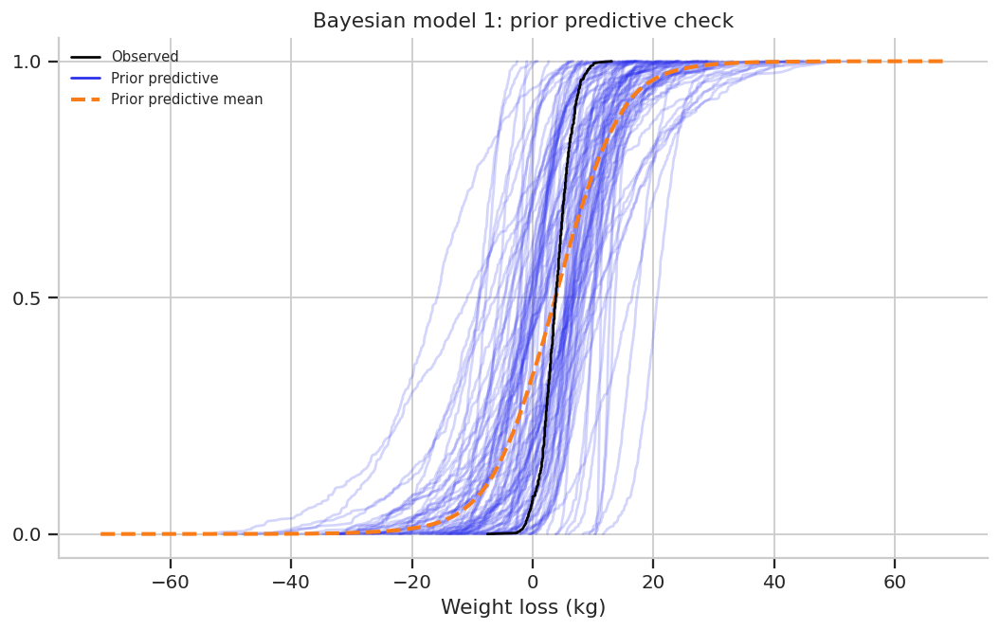

In [10]:
# ------------------------------------------------------------
# Prior predictive check
# ------------------------------------------------------------
az.plot_ppc(
    prior_bayes_age,
    group="prior",
    observed=True,
    kind='cumulative',
    num_pp_samples=100,
)

plt.title("Bayesian model 1: prior predictive check")
plt.xlabel("Weight loss (kg)")
plt.show()

Number of divergences in Bayesian model 1: one continuous predictor: 0


/tmp/ipykernel_46430/2689619132.py:16: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


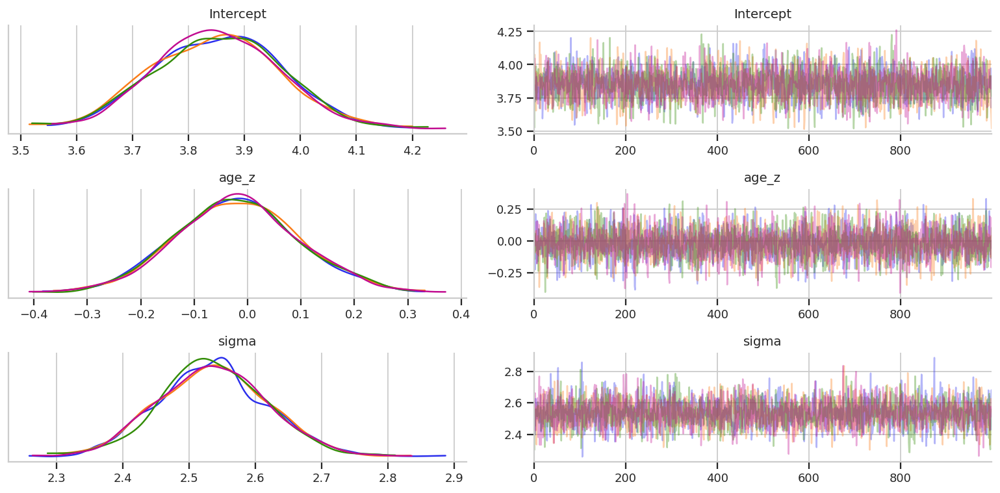

,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
Intercept,0.0,0.0,3989.0,3147.0,1.0
age_z,0.0,0.0,5149.0,2811.0,1.0
sigma,0.0,0.0,4111.0,2772.0,1.0


In [11]:
# ------------------------------------------------------------
# Sampling diagnostics
# ------------------------------------------------------------

print_divergences(
    idata_bayes_age,
    "Bayesian model 1: one continuous predictor",
)

az.plot_trace(
    idata_bayes_age,
    var_names=["Intercept", "age_z", "sigma"],
    compact=False,
)

plt.tight_layout()
plt.show()

az.summary(
    idata_bayes_age,
    var_names=["Intercept", "age_z", "sigma"],
    kind="diagnostics",
).round(2)

In [12]:
# ------------------------------------------------------------
# Posterior summary
# ------------------------------------------------------------
# The slope age_z is interpreted as the expected change in weight loss
# for a one-standard-deviation increase in age.

az.summary(
    idata_bayes_age,
    var_names=["Intercept", "age_z", "sigma"],
    hdi_prob=HDI_MASS,
    kind="stats",
).round(3)


,mean,sd,hdi_3%,hdi_97%
Intercept,3.851,0.113,3.652,4.066
age_z,-0.019,0.115,-0.231,0.203
sigma,2.536,0.082,2.385,2.691


/tmp/ipykernel_46430/1846296399.py:11: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


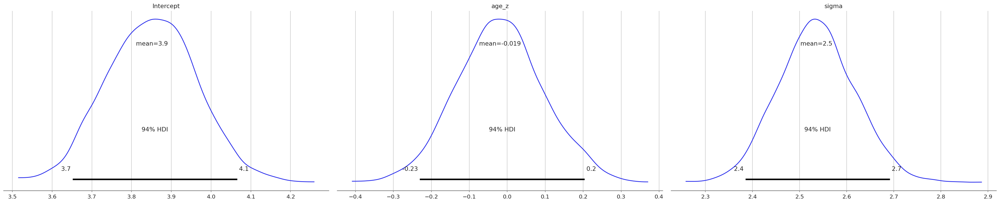

In [13]:
# ------------------------------------------------------------
# Posterior distributions
# ------------------------------------------------------------

az.plot_posterior(
    idata_bayes_age,
    var_names=["Intercept", "age_z", "sigma"],
    hdi_prob=HDI_MASS,
)

plt.tight_layout()
plt.show()


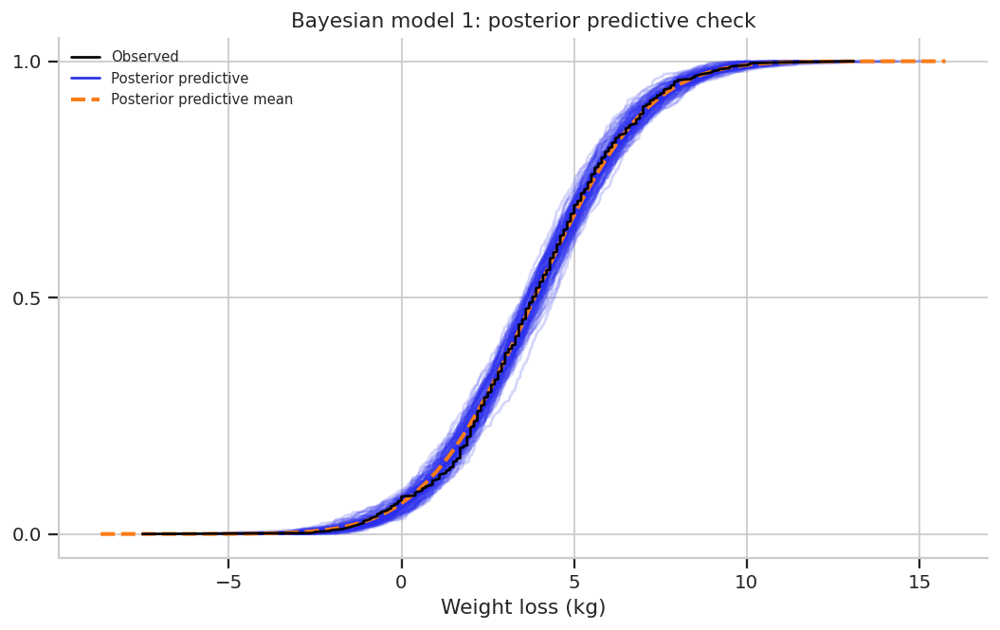

In [14]:
# ------------------------------------------------------------
# Posterior predictive check
# ------------------------------------------------------------
# This checks whether the fitted model generates weight-loss values
# similar to the observed weight-loss values.

bayes_age_model.predict(
    idata_bayes_age,
    kind="pps",
    inplace=True,
    random_seed=RANDOM_SEED,
)

az.plot_ppc(
    idata_bayes_age,
    group="posterior",
    observed=True,
    kind='cumulative',
    num_pp_samples=100,
)

plt.title("Bayesian model 1: posterior predictive check")
plt.xlabel("Weight loss (kg)")
plt.show()


/tmp/ipykernel_46430/1320632517.py:30: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


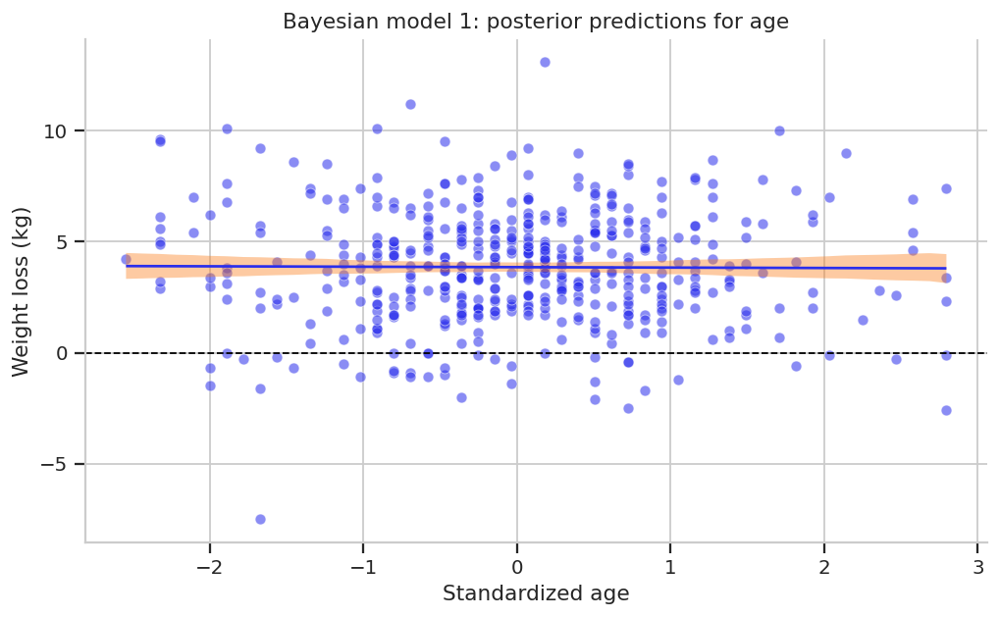

In [15]:
# ------------------------------------------------------------
# Bayesian prediction plot — Model 1
# One continuous predictor:
# weight_loss ~ age_z
# ------------------------------------------------------------

try:
    fig, ax = plt.subplots(figsize=(8, 5))

    sns.scatterplot(
        data=food,
        x="age_z",
        y="weight_loss",
        ax=ax,
        alpha=0.55,
    )

    bmb.interpret.plot_predictions(
        bayes_age_model,
        idata_bayes_age,
        conditional="age_z",
        ax=ax,
    )

    ax.axhline(0, color="black", linestyle="--", linewidth=1)
    ax.set_title("Bayesian model 1: posterior predictions for age")
    ax.set_xlabel("Standardized age")
    ax.set_ylabel("Weight loss (kg)")

    plt.tight_layout()
    plt.show()

except Exception as error:
    print("Bayesian model 1 prediction plot was skipped:")
    print(error)

## 11. Bayesian model 2 — one categorical predictor

Formula:

```text
weight_loss ~ diet_type
```

In [16]:
# ------------------------------------------------------------
# Bayesian model 2: one categorical predictor
# ------------------------------------------------------------
# Model:
# weight_loss ~ diet_type
#
# Interpretation:
# - Intercept: expected weight loss for the reference diet type
# - diet_type coefficients: differences in expected weight loss
#   compared with the reference diet type
# ------------------------------------------------------------

bayes_diet_model = bmb.Model(
    "weight_loss ~ diet_type",
    data=food,
)

print(bayes_diet_model)

idata_bayes_diet = bayes_diet_model.fit(
    draws=1000,
    chains=4,
    random_seed=RANDOM_SEED,
    target_accept=0.9,
)

prior_bayes_diet = bayes_diet_model.prior_predictive(
    draws=1000,
    random_seed=RANDOM_SEED,
)


       Formula: weight_loss ~ diet_type
        Family: gaussian
          Link: mu = identity
  Observations: 480
        Priors: 
    target = mu
        Common-level effects
            Intercept ~ Normal(mu: 3.8506, sigma: 8.9427)
            diet_type ~ Normal(mu: [0. 0.], sigma: [13.414 13.414])
        
        Auxiliary parameters
            sigma ~ HalfStudentT(nu: 4.0, sigma: 2.5294)


Output()

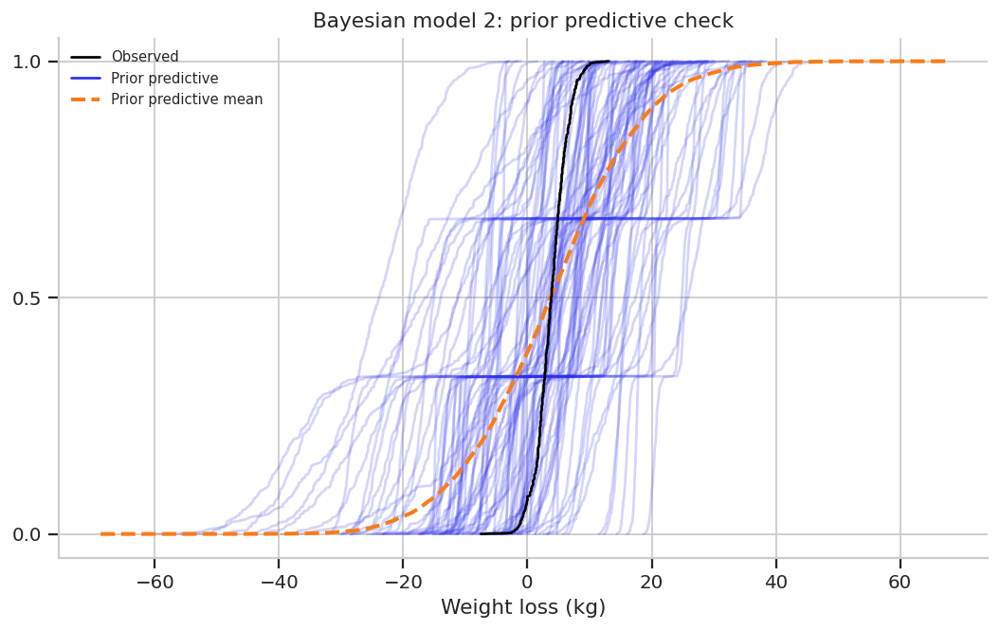

In [17]:
# ------------------------------------------------------------
# Prior predictive check
# ------------------------------------------------------------

az.plot_ppc(
    prior_bayes_diet,
    group="prior",
    observed=True,
    kind='cumulative',
    num_pp_samples=100,
)

plt.title("Bayesian model 2: prior predictive check")
plt.xlabel("Weight loss (kg)")
plt.show()

Number of divergences in Bayesian model 2: one categorical predictor: 0


/tmp/ipykernel_46430/4025665726.py:12: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


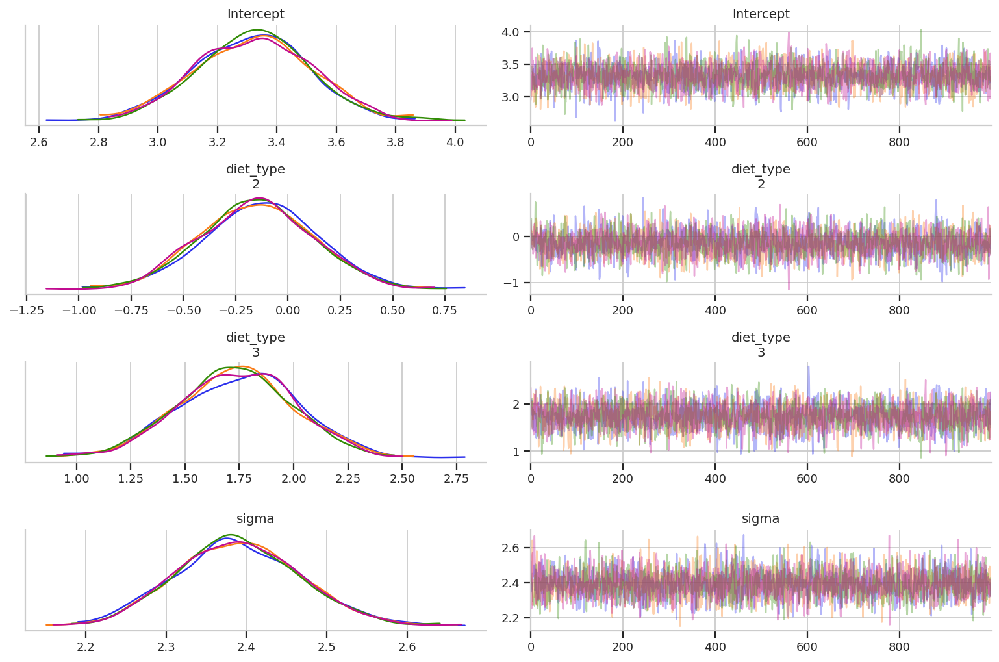

,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
Intercept,0.0,0.0,3430.0,2631.0,1.0
diet_type[2],0.0,0.0,3467.0,2827.0,1.0
diet_type[3],0.0,0.0,3625.0,2847.0,1.0
sigma,0.0,0.0,3999.0,3085.0,1.0


In [18]:
# ------------------------------------------------------------
# Sampling diagnostics
# ------------------------------------------------------------

print_divergences(idata_bayes_diet, "Bayesian model 2: one categorical predictor")

az.plot_trace(
    idata_bayes_diet,
    compact=False,
)

plt.tight_layout()
plt.show()

az.summary(
    idata_bayes_diet,
    kind="diagnostics",
).round(2)


In [19]:

# ------------------------------------------------------------
# Posterior summary
# ------------------------------------------------------------

az.summary(
    idata_bayes_diet,
    hdi_prob=HDI_MASS,
    kind="stats",
).round(3)

,mean,sd,hdi_3%,hdi_97%
Intercept,3.322,0.191,2.953,3.667
diet_type[2],-0.145,0.270,-0.650,0.346
diet_type[3],1.737,0.267,1.258,2.251
sigma,2.391,0.077,2.251,2.534


/tmp/ipykernel_46430/2695942567.py:10: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


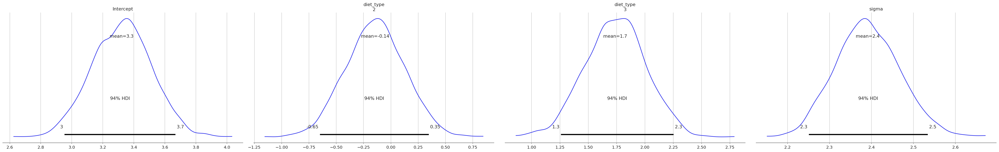

In [20]:
# ------------------------------------------------------------
# Posterior distributions
# ------------------------------------------------------------

az.plot_posterior(
    idata_bayes_diet,
    hdi_prob=HDI_MASS,
)

plt.tight_layout()
plt.show()

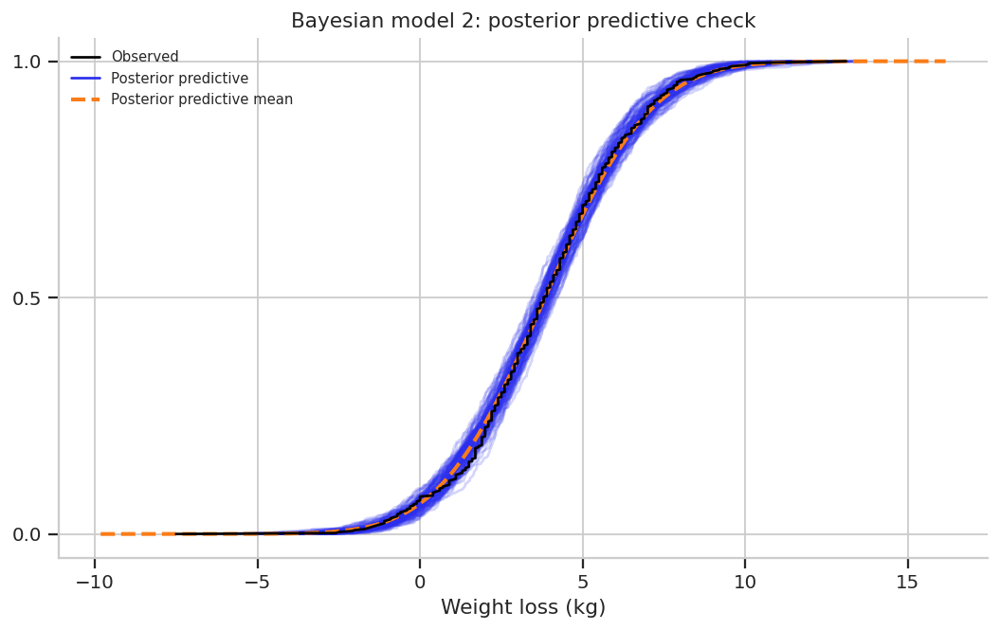

In [21]:
# ------------------------------------------------------------
# Posterior predictive check
# ------------------------------------------------------------

bayes_diet_model.predict(
    idata_bayes_diet,
    kind="pps",
    inplace=True,
    random_seed=RANDOM_SEED,
)

az.plot_ppc(
    idata_bayes_diet,
    group="posterior",
    kind='cumulative',
    observed=True,
    num_pp_samples=100,
)

plt.title("Bayesian model 2: posterior predictive check")
plt.xlabel("Weight loss (kg)")
plt.show()


/tmp/ipykernel_46430/2013929730.py:31: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


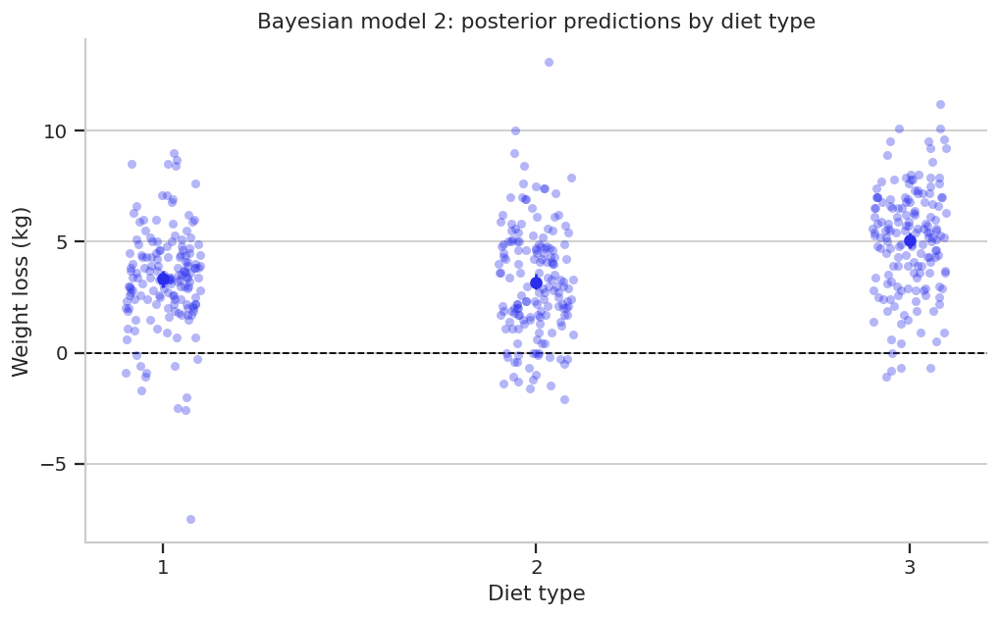

In [22]:
# ------------------------------------------------------------
# Bayesian prediction plot — Model 2
# One categorical predictor:
# weight_loss ~ diet_type
# ------------------------------------------------------------

try:
    fig, ax = plt.subplots(figsize=(8, 5))

    sns.stripplot(
        data=food,
        x="diet_type",
        y="weight_loss",
        alpha=0.35,
        jitter=True,
        ax=ax,
    )

    bmb.interpret.plot_predictions(
        bayes_diet_model,
        idata_bayes_diet,
        conditional="diet_type",
        ax=ax,
    )

    ax.axhline(0, color="black", linestyle="--", linewidth=1)
    ax.set_title("Bayesian model 2: posterior predictions by diet type")
    ax.set_xlabel("Diet type")
    ax.set_ylabel("Weight loss (kg)")

    plt.tight_layout()
    plt.show()

except Exception as error:
    print("Bayesian model 2 prediction plot was skipped:")
    print(error)

## 12. Bayesian model 3 — two continuous predictors

Formula:

```text
weight_loss ~ age_z + height_z
```

In [23]:
# ------------------------------------------------------------
# Bayesian model 3: two continuous predictors
# ------------------------------------------------------------
# Model:
# weight_loss ~ age_z + height_z
#
# Interpretation:
# - Intercept: expected weight loss for a person with average age
#   and average height
# - age_z: expected change in weight loss for a one-SD increase in age,
#   holding height fixed
# - height_z: expected change in weight loss for a one-SD increase in height,
#   holding age fixed
# ------------------------------------------------------------

bayes_age_height_model = bmb.Model(
    "weight_loss ~ age_z + height_z",
    data=food,
)

print(bayes_age_height_model)

idata_bayes_age_height = bayes_age_height_model.fit(
    draws=1000,
    chains=4,
    random_seed=RANDOM_SEED,
    target_accept=0.9,
)

prior_bayes_age_height = bayes_age_height_model.prior_predictive(
    draws=1000,
    random_seed=RANDOM_SEED,
)


       Formula: weight_loss ~ age_z + height_z
        Family: gaussian
          Link: mu = identity
  Observations: 480
        Priors: 
    target = mu
        Common-level effects
            Intercept ~ Normal(mu: 3.8506, sigma: 6.3234)
            age_z ~ Normal(mu: 0.0, sigma: 6.33)
            height_z ~ Normal(mu: 0.0, sigma: 6.33)
        
        Auxiliary parameters
            sigma ~ HalfStudentT(nu: 4.0, sigma: 2.5294)


Output()

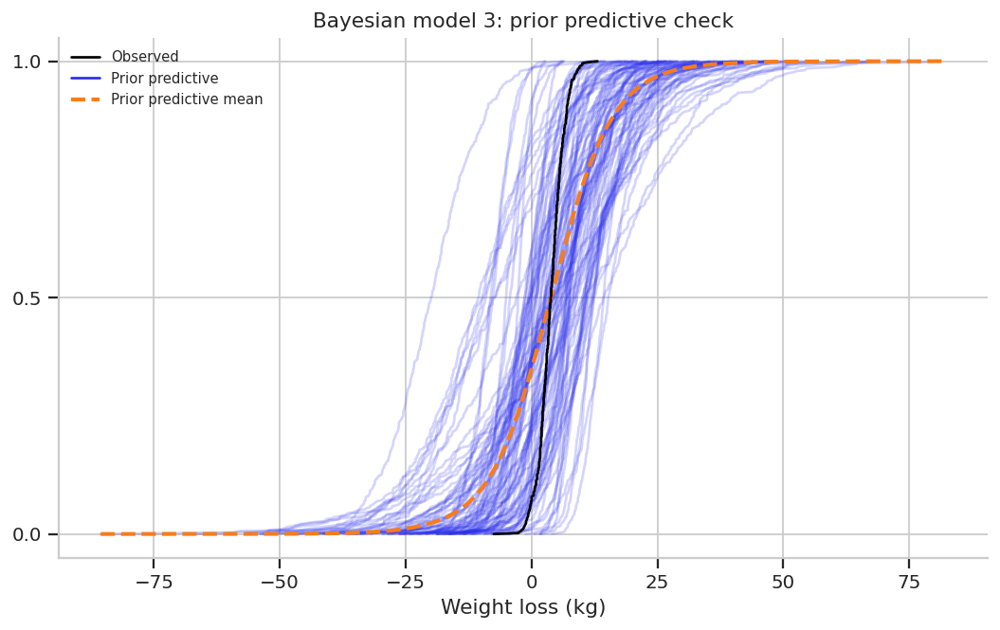

In [24]:
# ------------------------------------------------------------
# Prior predictive check
# ------------------------------------------------------------

az.plot_ppc(
    prior_bayes_age_height,
    group="prior",
    observed=True,
    kind='cumulative',
    num_pp_samples=100,
)

plt.title("Bayesian model 3: prior predictive check")
plt.xlabel("Weight loss (kg)")
plt.show()

Number of divergences in Bayesian model 3: two continuous predictors: 0


/tmp/ipykernel_46430/1875331973.py:12: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


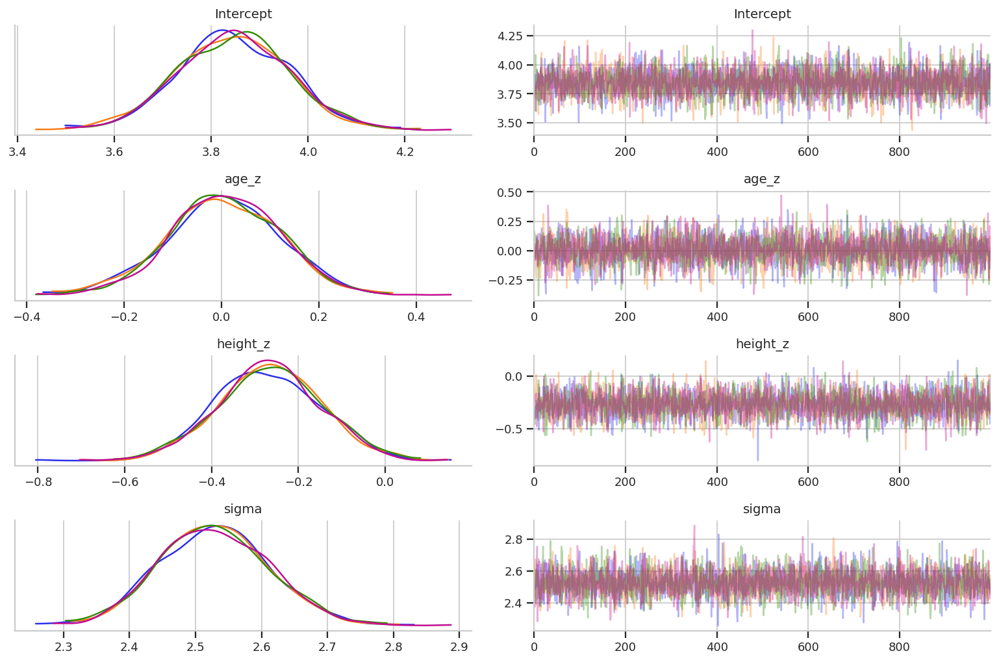

,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
Intercept,0.0,0.0,4545.0,3088.0,1.0
age_z,0.0,0.0,4007.0,2975.0,1.0
height_z,0.0,0.0,4195.0,3082.0,1.0
sigma,0.0,0.0,4282.0,2695.0,1.0


In [25]:
# ------------------------------------------------------------
# Sampling diagnostics
# ------------------------------------------------------------

print_divergences(idata_bayes_age_height, "Bayesian model 3: two continuous predictors")

az.plot_trace(
    idata_bayes_age_height,
    compact=False,
)

plt.tight_layout()
plt.show()

az.summary(
    idata_bayes_age_height,
    kind="diagnostics",
).round(2)


In [26]:
# ------------------------------------------------------------
# Posterior summary
# ------------------------------------------------------------

az.summary(
    idata_bayes_age_height,
    hdi_prob=HDI_MASS,
    kind="stats",
).round(3)

,mean,sd,hdi_3%,hdi_97%
Intercept,3.845,0.114,3.634,4.066
age_z,0.005,0.115,-0.214,0.218
height_z,-0.267,0.118,-0.495,-0.056
sigma,2.528,0.082,2.379,2.686


/tmp/ipykernel_46430/3138698228.py:10: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


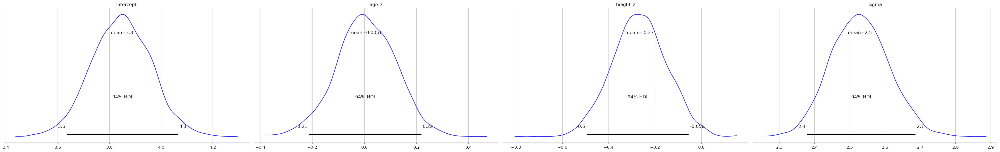

In [27]:

# ------------------------------------------------------------
# Posterior distributions
# ------------------------------------------------------------

az.plot_posterior(
    idata_bayes_age_height,
    hdi_prob=HDI_MASS,
)

plt.tight_layout()
plt.show()

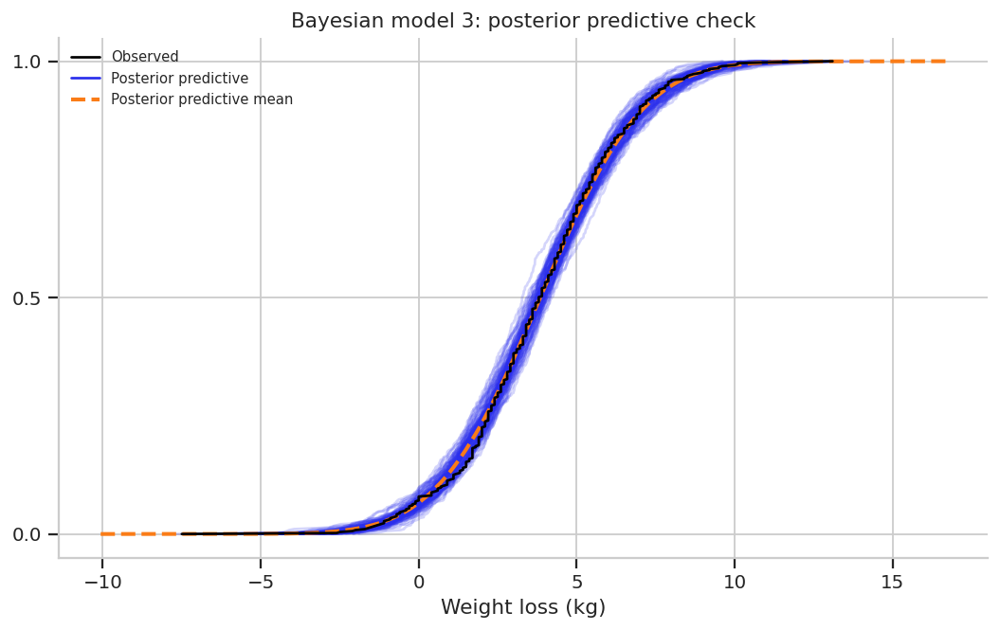

In [28]:
# ------------------------------------------------------------
# Posterior predictive check
# ------------------------------------------------------------

bayes_age_height_model.predict(
    idata_bayes_age_height,
    kind="pps",
    inplace=True,
    random_seed=RANDOM_SEED,
)

az.plot_ppc(
    idata_bayes_age_height,
    group="posterior",
    kind='cumulative',
    observed=True,
    num_pp_samples=100,
)

plt.title("Bayesian model 3: posterior predictive check")
plt.xlabel("Weight loss (kg)")
plt.show()


/tmp/ipykernel_46430/912789998.py:34: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


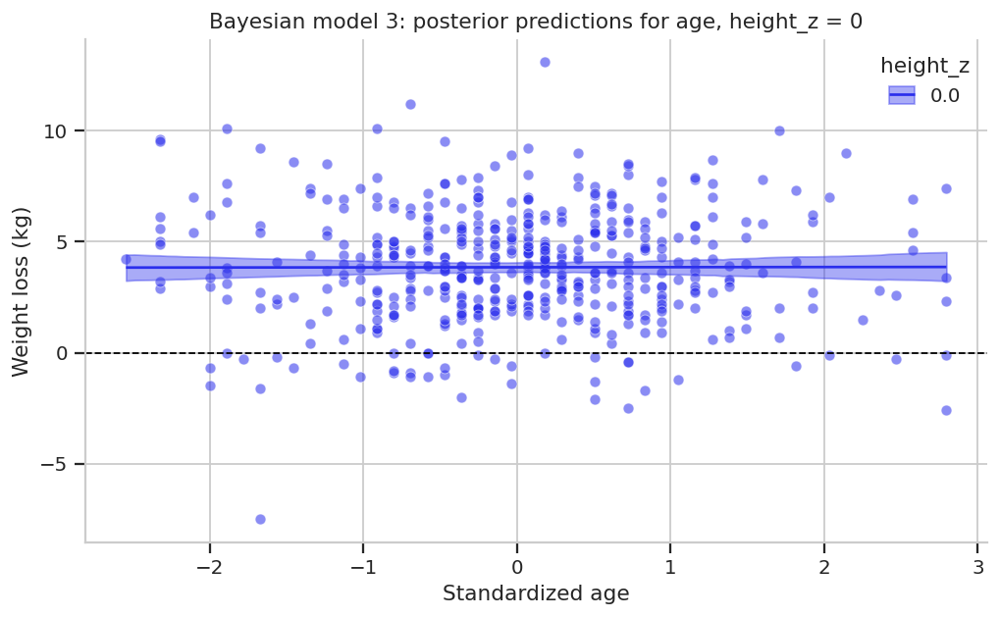

In [29]:
# ------------------------------------------------------------
# Bayesian prediction plot — Model 3
# Two continuous predictors:
# weight_loss ~ age_z + height_z
#
# We plot predictions as a function of age_z.
# height_z is held at its standardized mean, 0.
# ------------------------------------------------------------

try:
    fig, ax = plt.subplots(figsize=(8, 5))

    sns.scatterplot(
        data=food,
        x="age_z",
        y="weight_loss",
        ax=ax,
        alpha=0.55,
    )

    bmb.interpret.plot_predictions(
        bayes_age_height_model,
        idata_bayes_age_height,
        conditional={"age_z": np.linspace(food["age_z"].min(), food["age_z"].max(), 100),
                     "height_z": [0]},
        ax=ax,
    )

    ax.axhline(0, color="black", linestyle="--", linewidth=1)
    ax.set_title("Bayesian model 3: posterior predictions for age, height_z = 0")
    ax.set_xlabel("Standardized age")
    ax.set_ylabel("Weight loss (kg)")

    plt.tight_layout()
    plt.show()

except Exception as error:
    print("Bayesian model 3 prediction plot was skipped:")
    print(error)

/tmp/ipykernel_46430/1573507695.py:37: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


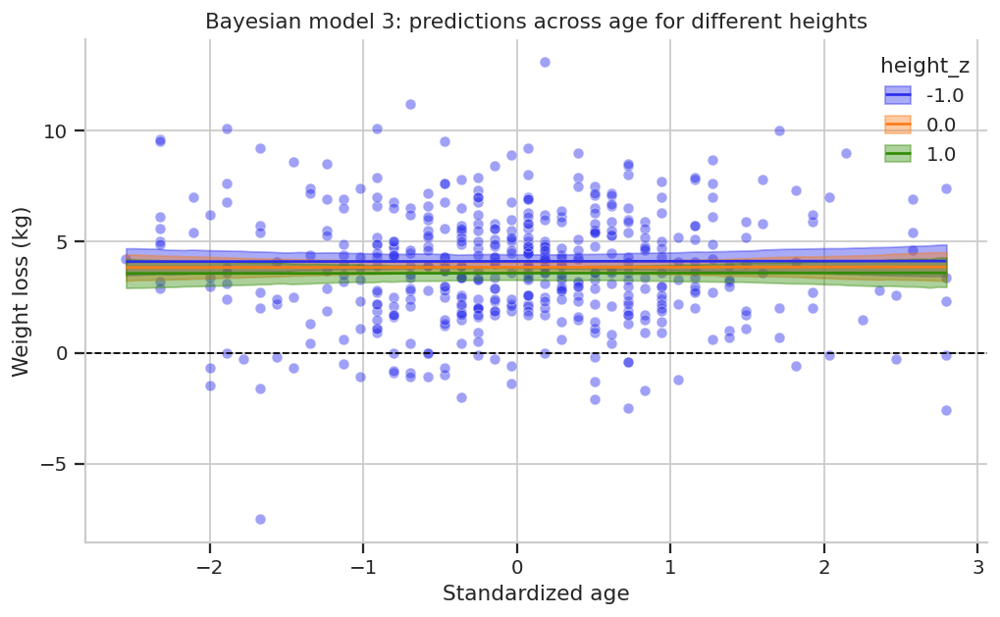

Each line shows the predicted relationship between age and weight loss
for a fixed standardized height value.
height_z = -1: one standard deviation below the mean height
height_z = 0: mean height
height_z = 1: one standard deviation above the mean height


In [30]:
# ------------------------------------------------------------
# Bayesian prediction plot — Model 3
# Two continuous predictors:
# weight_loss ~ age_z + height_z
#
# The model uses both predictors.
# In a 2D plot, we show predictions across age_z
# for three fixed values of height_z.
# ------------------------------------------------------------

try:
    fig, ax = plt.subplots(figsize=(8, 5))

    sns.scatterplot(
        data=food,
        x="age_z",
        y="weight_loss",
        ax=ax,
        alpha=0.45,
    )

    bmb.interpret.plot_predictions(
        bayes_age_height_model,
        idata_bayes_age_height,
        conditional={
            "age_z": np.linspace(food["age_z"].min(), food["age_z"].max(), 100),
            "height_z": [-1, 0, 1],
        },
        ax=ax,
    )

    ax.axhline(0, color="black", linestyle="--", linewidth=1)
    ax.set_title("Bayesian model 3: predictions across age for different heights")
    ax.set_xlabel("Standardized age")
    ax.set_ylabel("Weight loss (kg)")

    plt.tight_layout()
    plt.show()

except Exception as error:
    print("Bayesian model 3 prediction plot was skipped:")
    print(error)

print("Each line shows the predicted relationship between age and weight loss")
print("for a fixed standardized height value.")
print("height_z = -1: one standard deviation below the mean height")
print("height_z = 0: mean height")
print("height_z = 1: one standard deviation above the mean height")



/tmp/ipykernel_46430/2208941445.py:38: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


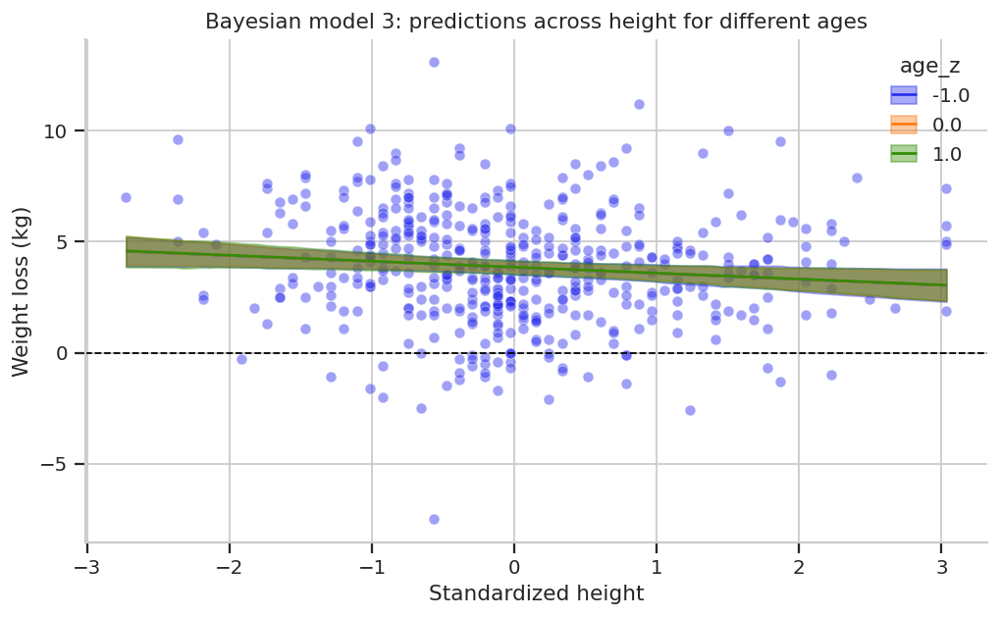

Each line shows the predicted relationship between height and weight loss
for a fixed standardized age value.
age_z = -1: one standard deviation below the mean age
age_z = 0: mean age
age_z = 1: one standard deviation above the mean age


In [31]:
# ------------------------------------------------------------
# Bayesian prediction plot — Model 3
# Two continuous predictors:
# weight_loss ~ age_z + height_z
#
# The model uses both age_z and height_z.
# A two-dimensional plot can show only one predictor on the x-axis.
# Therefore, we visualize slices of the fitted regression surface:
# predicted weight loss across height_z for selected fixed values of age_z.
# ------------------------------------------------------------

try:
    fig, ax = plt.subplots(figsize=(8, 5))

    sns.scatterplot(
        data=food,
        x="height_z",
        y="weight_loss",
        ax=ax,
        alpha=0.45,
    )

    bmb.interpret.plot_predictions(
        bayes_age_height_model,
        idata_bayes_age_height,
        conditional={
            "height_z": np.linspace(food["height_z"].min(), food["height_z"].max(), 100),
            "age_z": [-1, 0, 1],
        },
        ax=ax,
    )

    ax.axhline(0, color="black", linestyle="--", linewidth=1)
    ax.set_title("Bayesian model 3: predictions across height for different ages")
    ax.set_xlabel("Standardized height")
    ax.set_ylabel("Weight loss (kg)")

    plt.tight_layout()
    plt.show()

except Exception as error:
    print("Bayesian model 3 prediction plot was skipped:")
    print(error)

print("Each line shows the predicted relationship between height and weight loss")
print("for a fixed standardized age value.")
print("age_z = -1: one standard deviation below the mean age")
print("age_z = 0: mean age")
print("age_z = 1: one standard deviation above the mean age")

## 13. Bayesian model 4 — two categorical predictors

Formula:

```text
weight_loss ~ diet_type + gender
```

In [32]:

# ------------------------------------------------------------
# Bayesian model 4: two categorical predictors
# ------------------------------------------------------------
# Model:
# weight_loss ~ diet_type + gender
#
# Interpretation:
# - Intercept: expected weight loss for the reference diet type
#   and reference gender
# - diet_type coefficients: diet differences adjusted for gender
# - gender coefficients: gender differences adjusted for diet type
#
# This is an additive model:
# the diet effect is assumed not to depend on gender.
# ------------------------------------------------------------

bayes_diet_gender_model = bmb.Model(
    "weight_loss ~ diet_type + gender",
    data=food,
)

print(bayes_diet_gender_model)

idata_bayes_diet_gender = bayes_diet_gender_model.fit(
    draws=1000,
    chains=4,
    random_seed=RANDOM_SEED,
    target_accept=0.9,
)

prior_bayes_diet_gender = bayes_diet_gender_model.prior_predictive(
    draws=1000,
    random_seed=RANDOM_SEED,
)

       Formula: weight_loss ~ diet_type + gender
        Family: gaussian
          Link: mu = identity
  Observations: 480
        Priors: 
    target = mu
        Common-level effects
            Intercept ~ Normal(mu: 3.8506, sigma: 10.9525)
            diet_type ~ Normal(mu: [0. 0.], sigma: [13.414 13.414])
            gender ~ Normal(mu: 0.0, sigma: 12.6468)
        
        Auxiliary parameters
            sigma ~ HalfStudentT(nu: 4.0, sigma: 2.5294)


Output()

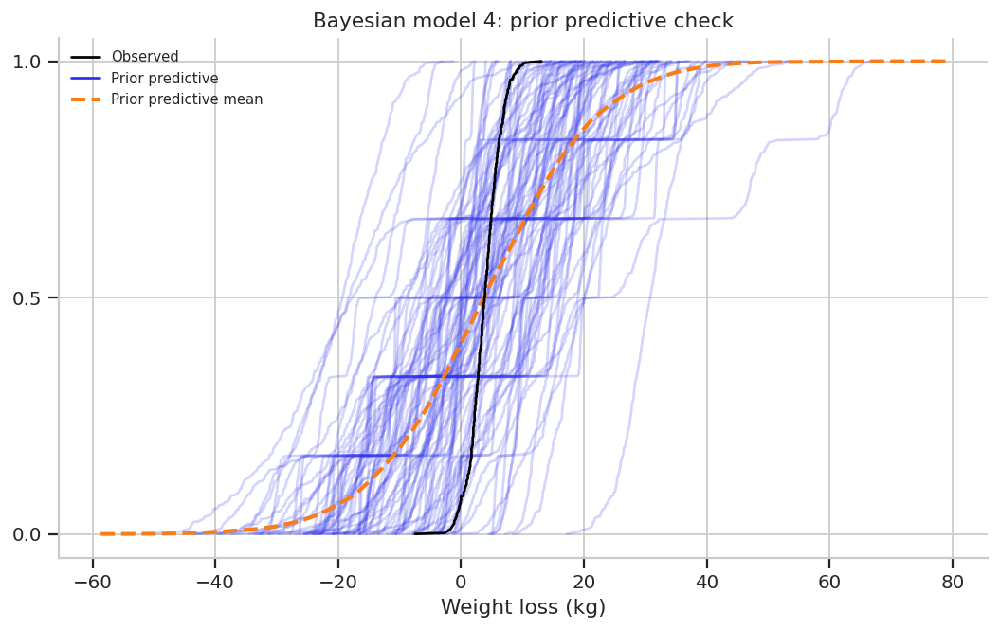

In [33]:
# ------------------------------------------------------------
# Prior predictive check
# ------------------------------------------------------------

az.plot_ppc(
    prior_bayes_diet_gender,
    group="prior",
    kind='cumulative',
    observed=True,
    num_pp_samples=100,
)

plt.title("Bayesian model 4: prior predictive check")
plt.xlabel("Weight loss (kg)")
plt.show()


Number of divergences in Bayesian model 4: two categorical predictors: 0


/tmp/ipykernel_46430/3006241363.py:12: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


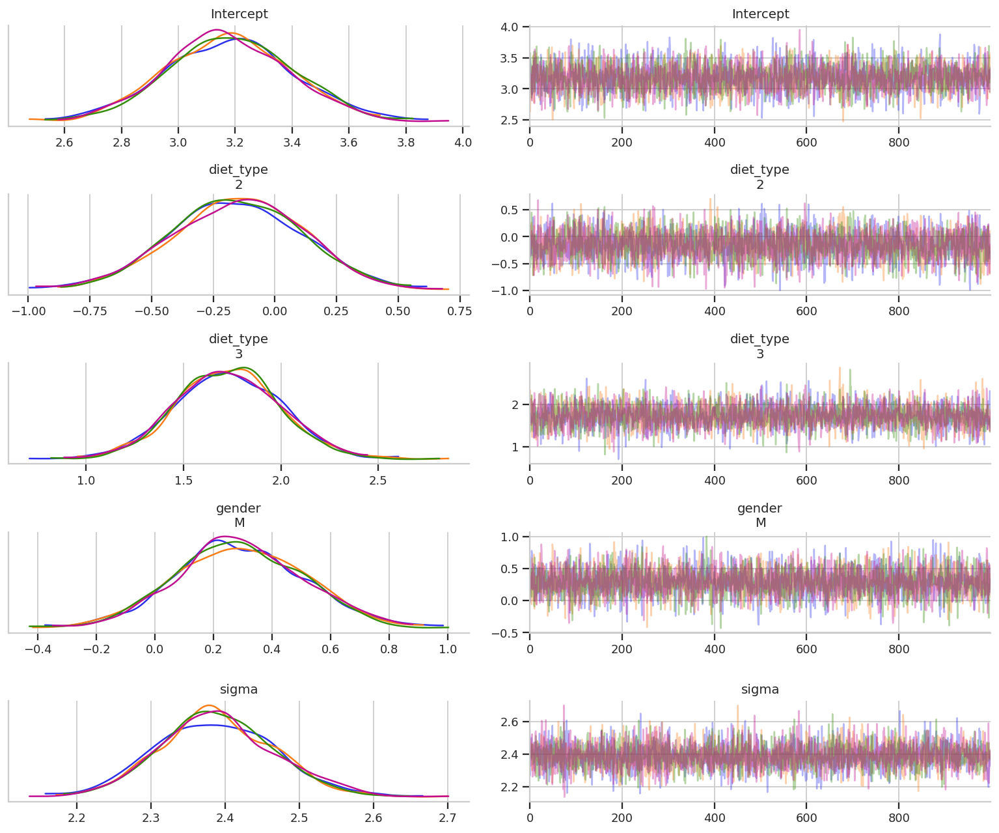

,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
Intercept,0.0,0.0,3933.0,3238.0,1.0
diet_type[2],0.0,0.0,3661.0,2743.0,1.0
diet_type[3],0.0,0.0,3843.0,3225.0,1.0
gender[M],0.0,0.0,4262.0,2901.0,1.0
sigma,0.0,0.0,4977.0,2789.0,1.0


In [34]:
# ------------------------------------------------------------
# Sampling diagnostics
# ------------------------------------------------------------

print_divergences(idata_bayes_diet_gender, "Bayesian model 4: two categorical predictors")

az.plot_trace(
    idata_bayes_diet_gender,
    compact=False,
)

plt.tight_layout()
plt.show()

az.summary(
    idata_bayes_diet_gender,
    kind="diagnostics",
).round(2)

In [35]:
# ------------------------------------------------------------
# Posterior summary
# ------------------------------------------------------------

az.summary(
    idata_bayes_diet_gender,
    hdi_prob=HDI_MASS,
    kind="stats",
).round(3)


,mean,sd,hdi_3%,hdi_97%
Intercept,3.178,0.217,2.770,3.579
diet_type[2],-0.151,0.265,-0.625,0.373
diet_type[3],1.729,0.266,1.240,2.242
gender[M],0.289,0.217,-0.098,0.714
sigma,2.389,0.078,2.259,2.550


/tmp/ipykernel_46430/2082126089.py:10: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


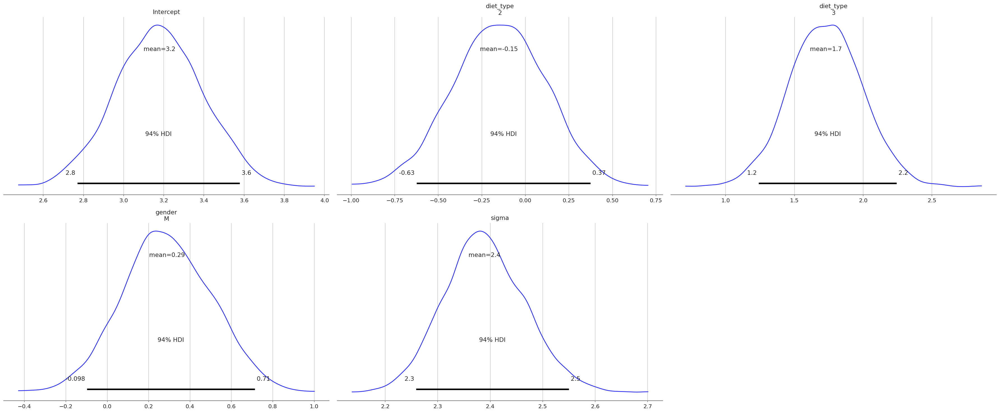

In [36]:
# ------------------------------------------------------------
# Posterior distributions
# ------------------------------------------------------------

az.plot_posterior(
    idata_bayes_diet_gender,
    hdi_prob=HDI_MASS,
)

plt.tight_layout()
plt.show()

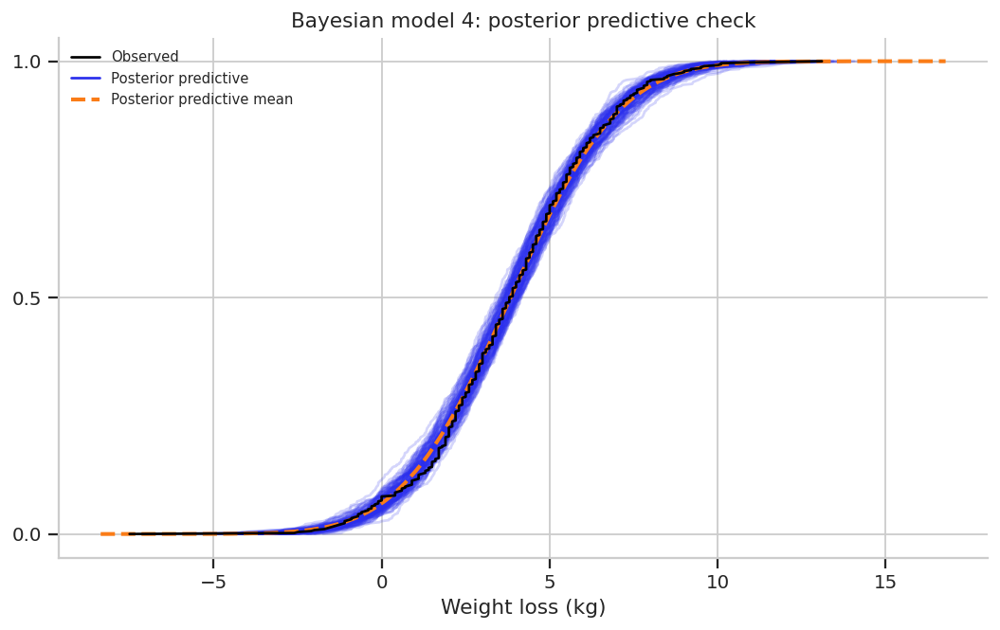

In [37]:
# ------------------------------------------------------------
# Posterior predictive check
# ------------------------------------------------------------

bayes_diet_gender_model.predict(
    idata_bayes_diet_gender,
    kind="pps",
    inplace=True,
    random_seed=RANDOM_SEED,
)

az.plot_ppc(
    idata_bayes_diet_gender,
    group="posterior",
    kind='cumulative',
    observed=True,
    num_pp_samples=100,
)

plt.title("Bayesian model 4: posterior predictive check")
plt.xlabel("Weight loss (kg)")
plt.show()

/tmp/ipykernel_46430/1013406097.py:36: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


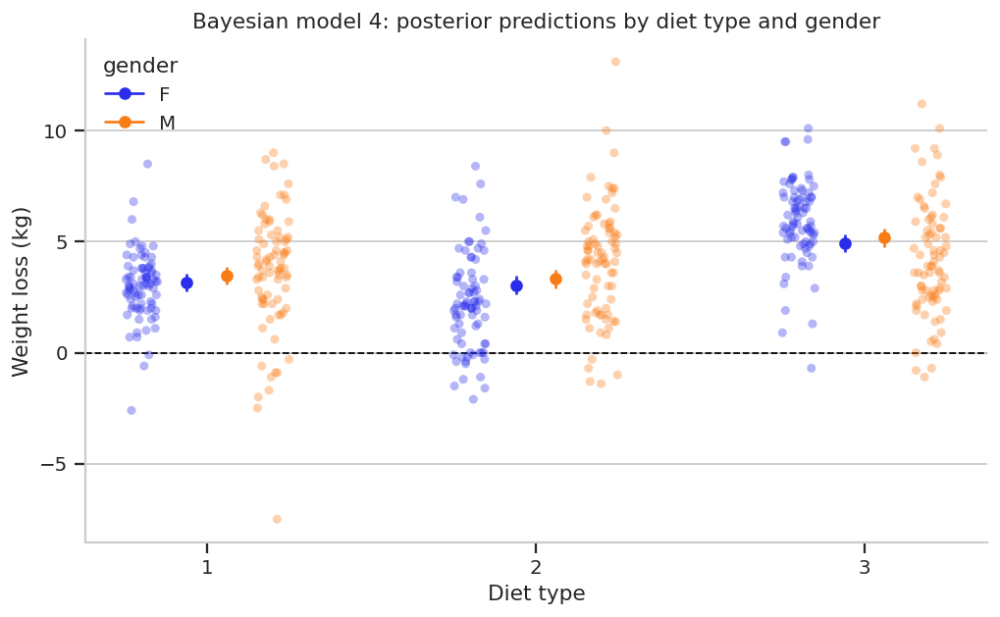

In [38]:
# ------------------------------------------------------------
# Bayesian prediction plot — Model 4
# Two categorical predictors:
# weight_loss ~ diet_type + gender
#
# This is an additive model:
# diet and gender contribute separately.
# ------------------------------------------------------------

try:
    fig, ax = plt.subplots(figsize=(8, 5))

    sns.stripplot(
        data=food,
        x="diet_type",
        y="weight_loss",
        hue="gender",
        dodge=True,
        alpha=0.35,
        jitter=True,
        ax=ax,
    )

    bmb.interpret.plot_predictions(
        bayes_diet_gender_model,
        idata_bayes_diet_gender,
        conditional=["diet_type", "gender"],
        ax=ax,
    )

    ax.axhline(0, color="black", linestyle="--", linewidth=1)
    ax.set_title("Bayesian model 4: posterior predictions by diet type and gender")
    ax.set_xlabel("Diet type")
    ax.set_ylabel("Weight loss (kg)")

    plt.tight_layout()
    plt.show()

except Exception as error:
    print("Bayesian model 4 prediction plot was skipped:")
    print(error)

## 14. Bayesian model 5 — continuous + categorical

Formula:

```text
weight_loss ~ age_z + diet_type
```

In [39]:
# ------------------------------------------------------------
# Bayesian model 5: continuous + categorical predictor
# ------------------------------------------------------------
# Model:
# weight_loss ~ age_z + diet_type
#
# Interpretation:
# - Intercept: expected weight loss for a person with average age
#   in the reference diet type
# - age_z: expected change in weight loss for a one-SD increase in age,
#   assuming the same age slope for all diet types
# - diet_type coefficients: vertical shifts relative to the reference diet type
#
# This is an additive model:
# different intercepts by diet type, same age slope.
# ------------------------------------------------------------

bayes_age_diet_model = bmb.Model(
    "weight_loss ~ age_z + diet_type",
    data=food,
)

print(bayes_age_diet_model)

idata_bayes_age_diet = bayes_age_diet_model.fit(
    draws=1000,
    chains=4,
    random_seed=RANDOM_SEED,
    target_accept=0.9,
)

prior_bayes_age_diet = bayes_age_diet_model.prior_predictive(
    draws=1000,
    random_seed=RANDOM_SEED,
)

       Formula: weight_loss ~ age_z + diet_type
        Family: gaussian
          Link: mu = identity
  Observations: 480
        Priors: 
    target = mu
        Common-level effects
            Intercept ~ Normal(mu: 3.8506, sigma: 8.9427)
            age_z ~ Normal(mu: 0.0, sigma: 6.33)
            diet_type ~ Normal(mu: [0. 0.], sigma: [13.414 13.414])
        
        Auxiliary parameters
            sigma ~ HalfStudentT(nu: 4.0, sigma: 2.5294)


Output()

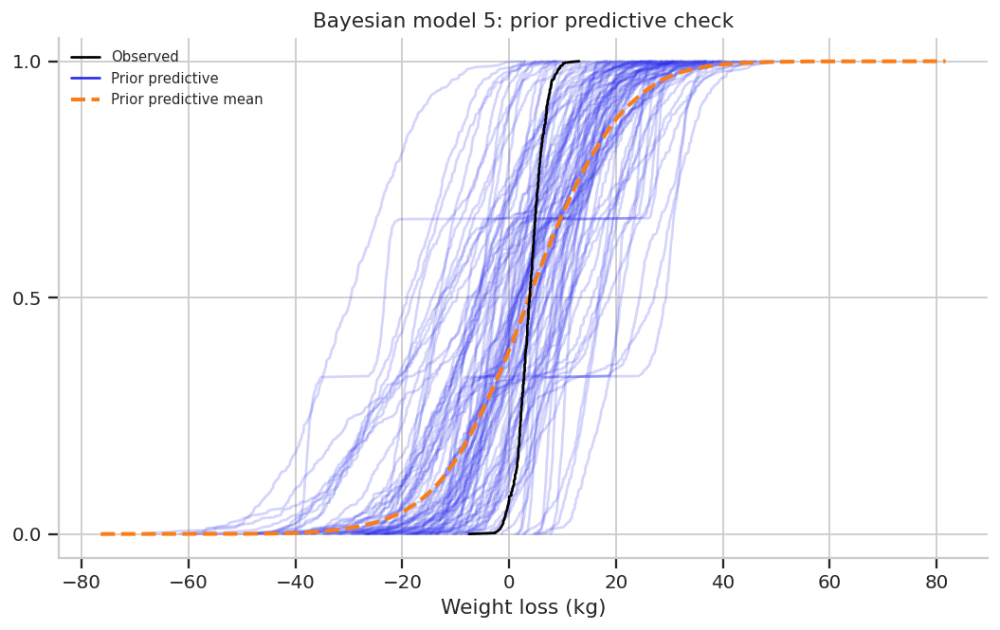

In [40]:
# ------------------------------------------------------------
# Prior predictive check
# ------------------------------------------------------------

az.plot_ppc(
    prior_bayes_age_diet,
    group="prior",
    kind='cumulative',
    observed=True,
    num_pp_samples=100,
)

plt.title("Bayesian model 5: prior predictive check")
plt.xlabel("Weight loss (kg)")
plt.show()

Number of divergences in Bayesian model 5: continuous + categorical predictor: 0


/tmp/ipykernel_46430/3314377990.py:12: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


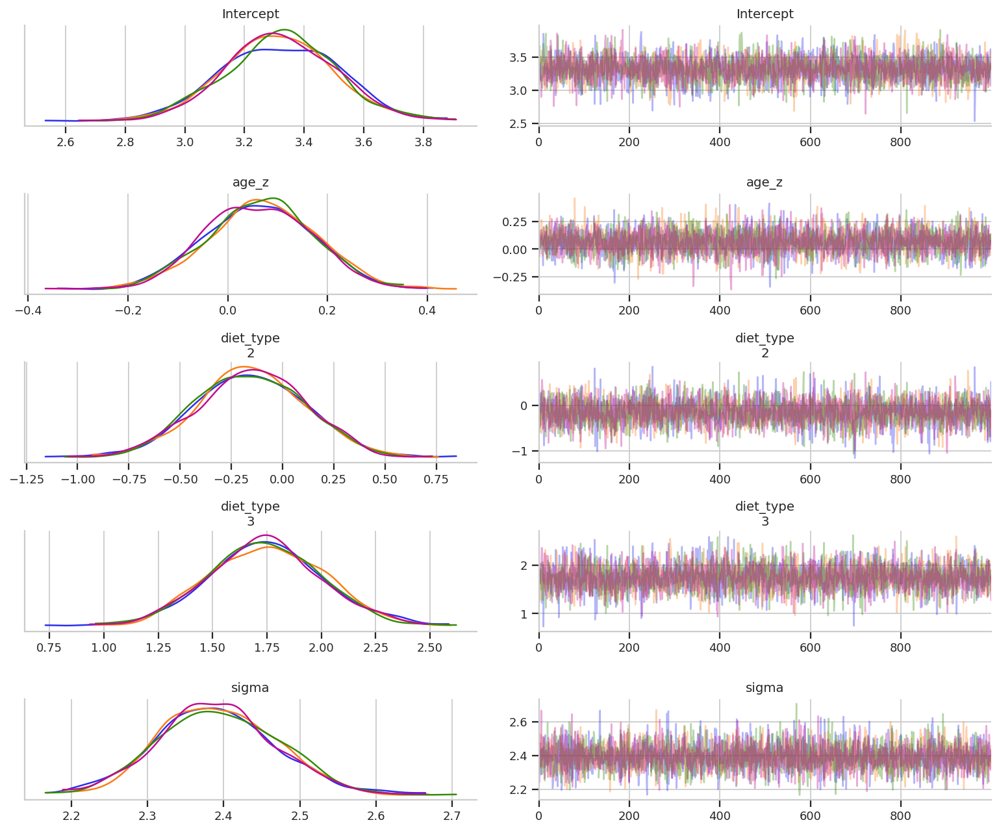

,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
Intercept,0.0,0.0,3836.0,2802.0,1.0
age_z,0.0,0.0,4571.0,2792.0,1.0
diet_type[2],0.0,0.0,3903.0,3321.0,1.0
diet_type[3],0.0,0.0,4210.0,3188.0,1.0
sigma,0.0,0.0,4548.0,3118.0,1.0


In [41]:
# ------------------------------------------------------------
# Sampling diagnostics
# ------------------------------------------------------------

print_divergences(idata_bayes_age_diet, "Bayesian model 5: continuous + categorical predictor")

az.plot_trace(
    idata_bayes_age_diet,
    compact=False,
)

plt.tight_layout()
plt.show()

az.summary(
    idata_bayes_age_diet,
    kind="diagnostics",
).round(2)

In [42]:
# ------------------------------------------------------------
# Posterior summary
# ------------------------------------------------------------

az.summary(
    idata_bayes_age_diet,
    hdi_prob=HDI_MASS,
    kind="stats",
).round(3)


,mean,sd,hdi_3%,hdi_97%
Intercept,3.319,0.187,2.959,3.664
age_z,0.065,0.108,-0.135,0.261
diet_type[2],-0.152,0.273,-0.664,0.344
diet_type[3],1.745,0.265,1.262,2.259
sigma,2.392,0.077,2.249,2.536


/tmp/ipykernel_46430/3349893632.py:10: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


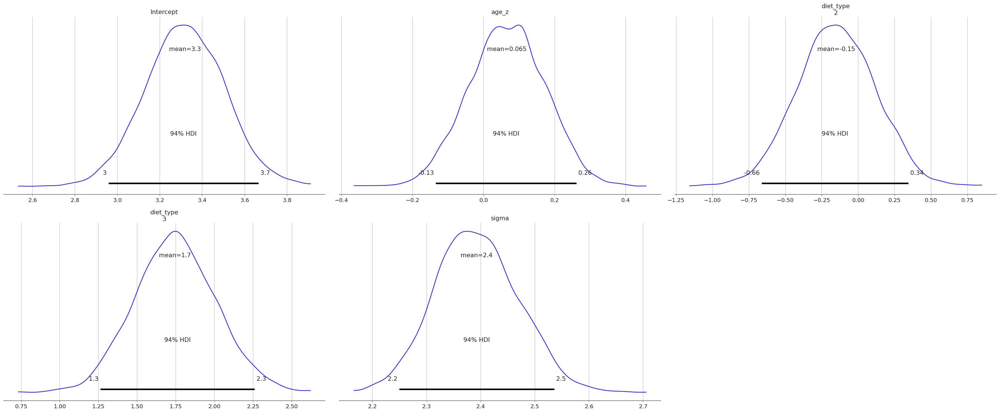

In [43]:
# ------------------------------------------------------------
# Posterior distributions
# ------------------------------------------------------------

az.plot_posterior(
    idata_bayes_age_diet,
    hdi_prob=HDI_MASS,
)

plt.tight_layout()
plt.show()


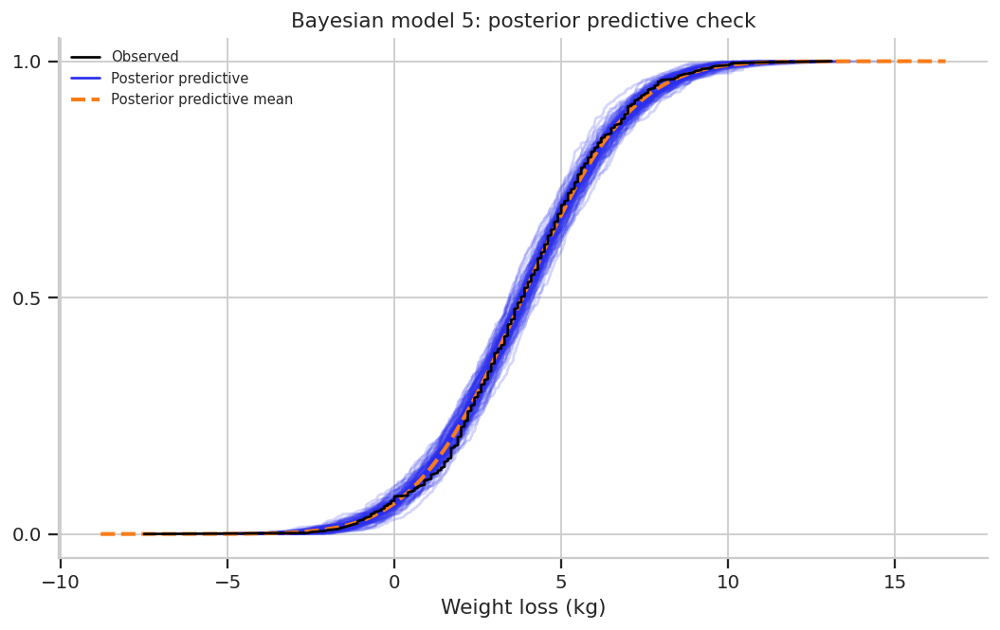

In [44]:
# ------------------------------------------------------------
# Posterior predictive check
# ------------------------------------------------------------

bayes_age_diet_model.predict(
    idata_bayes_age_diet,
    kind="pps",
    inplace=True,
    random_seed=RANDOM_SEED,
)

az.plot_ppc(
    idata_bayes_age_diet,
    group="posterior",
    kind='cumulative',
    observed=True,
    num_pp_samples=100,
)

plt.title("Bayesian model 5: posterior predictive check")
plt.xlabel("Weight loss (kg)")
plt.show()


/tmp/ipykernel_46430/594389913.py:34: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


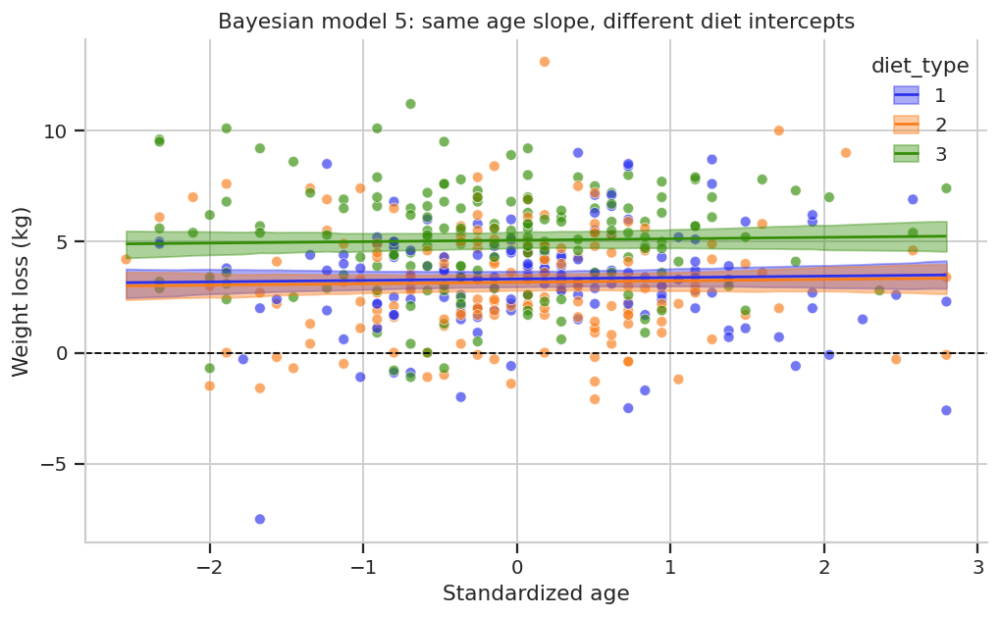

In [45]:

# ------------------------------------------------------------
# Bayesian prediction plot — Model 5
# Continuous + categorical predictors:
# weight_loss ~ age_z + diet_type
#
# This is an additive model:
# different diet intercepts, same age slope.
# ------------------------------------------------------------

try:
    fig, ax = plt.subplots(figsize=(8, 5))

    sns.scatterplot(
        data=food,
        x="age_z",
        y="weight_loss",
        hue="diet_type",
        ax=ax,
        alpha=0.65,
    )

    bmb.interpret.plot_predictions(
        bayes_age_diet_model,
        idata_bayes_age_diet,
        conditional=["age_z", "diet_type"],
        ax=ax,
    )

    ax.axhline(0, color="black", linestyle="--", linewidth=1)
    ax.set_title("Bayesian model 5: same age slope, different diet intercepts")
    ax.set_xlabel("Standardized age")
    ax.set_ylabel("Weight loss (kg)")

    plt.tight_layout()
    plt.show()

except Exception as error:
    print("Bayesian model 5 prediction plot was skipped:")
    print(error)

## 15. Bayesian model 6 — interaction

Formula:

```text
weight_loss ~ age_z * diet_type
```

In [46]:

# ------------------------------------------------------------
# Bayesian model 6: interaction model
# ------------------------------------------------------------
# Model:
# weight_loss ~ age_z * diet_type
#
# This is equivalent to:
# weight_loss ~ age_z + diet_type + age_z:diet_type
#
# Interpretation:
# - Intercept: expected weight loss for a person with average age
#   in the reference diet type
# - age_z: age slope for the reference diet type
# - diet_type coefficients: intercept shifts relative to the reference diet type
# - age_z:diet_type coefficients: slope differences relative to the reference diet type
#
# This model allows the age-weight-loss relationship to differ between diets.
# ------------------------------------------------------------

bayes_age_diet_interaction_model = bmb.Model(
    "weight_loss ~ age_z * diet_type",
    data=food,
)

print(bayes_age_diet_interaction_model)

idata_bayes_age_diet_interaction = bayes_age_diet_interaction_model.fit(
    draws=1000,
    chains=4,
    random_seed=RANDOM_SEED,
    target_accept=0.9,
)

prior_bayes_age_diet_interaction = bayes_age_diet_interaction_model.prior_predictive(
    draws=1000,
    random_seed=RANDOM_SEED,
)


       Formula: weight_loss ~ age_z * diet_type
        Family: gaussian
          Link: mu = identity
  Observations: 480
        Priors: 
    target = mu
        Common-level effects
            Intercept ~ Normal(mu: 3.8506, sigma: 8.9582)
            age_z ~ Normal(mu: 0.0, sigma: 6.33)
            diet_type ~ Normal(mu: [0. 0.], sigma: [13.414 13.414])
            age_z:diet_type ~ Normal(mu: [0. 0.], sigma: [11.2352 10.6937])
        
        Auxiliary parameters
            sigma ~ HalfStudentT(nu: 4.0, sigma: 2.5294)


Output()

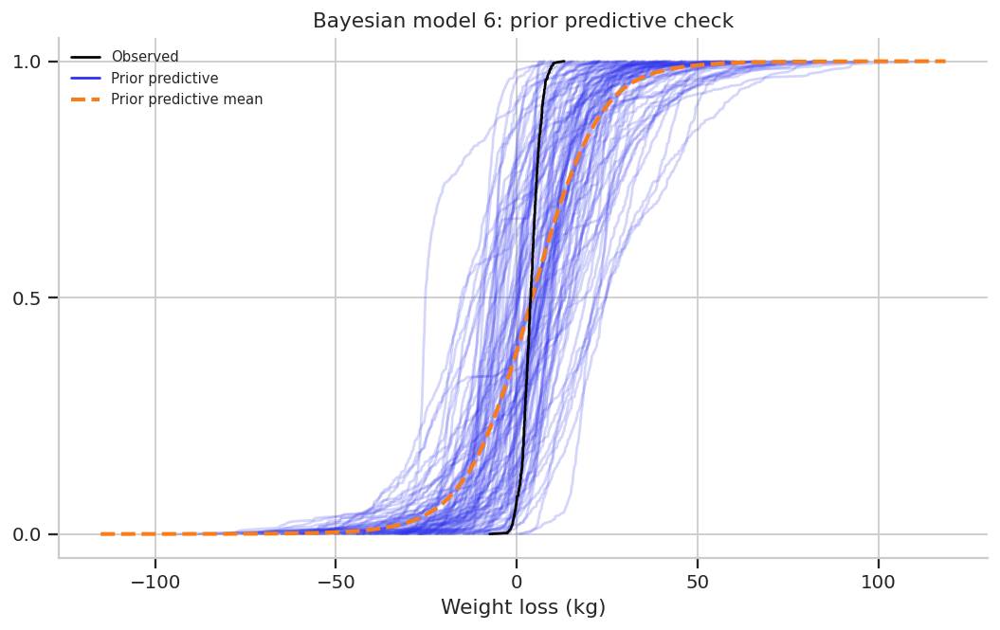

In [47]:
# ------------------------------------------------------------
# Prior predictive check
# ------------------------------------------------------------

az.plot_ppc(
    prior_bayes_age_diet_interaction,
    group="prior",
    kind='cumulative',
    observed=True,
    num_pp_samples=100,
)

plt.title("Bayesian model 6: prior predictive check")
plt.xlabel("Weight loss (kg)")
plt.show()


Number of divergences in Bayesian model 6: continuous by categorical interaction: 0


/tmp/ipykernel_46430/1399037501.py:15: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


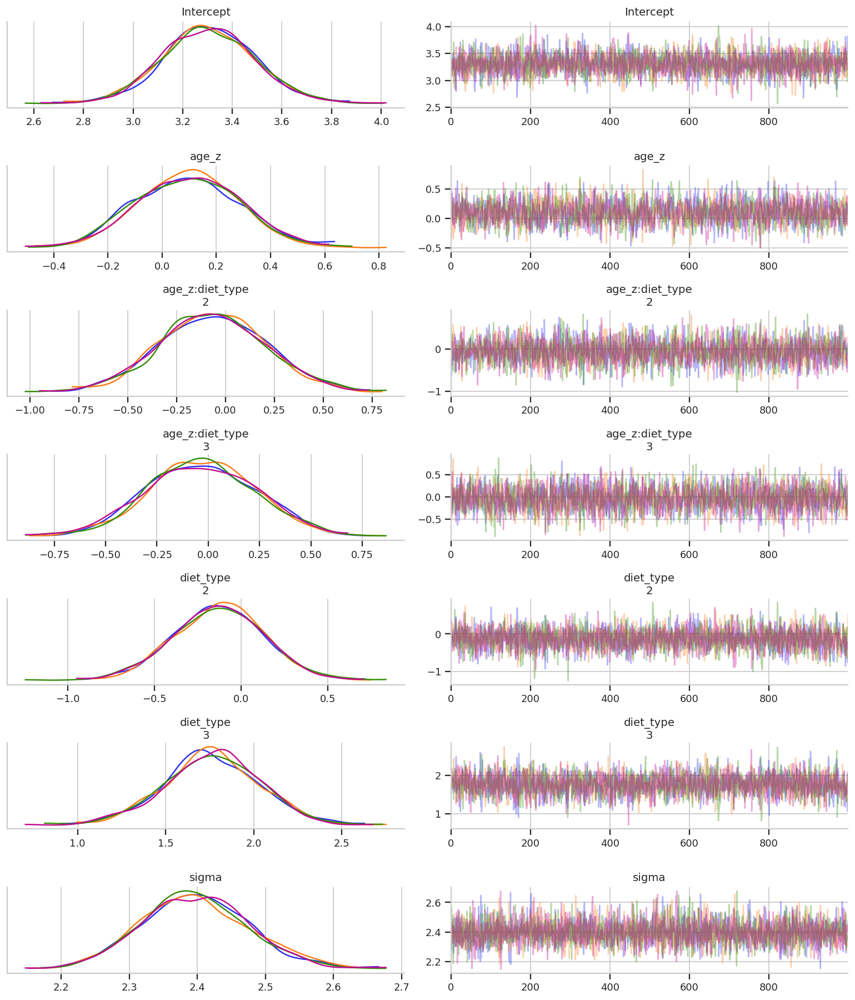

,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
Intercept,0.0,0.0,3210.0,2608.0,1.0
age_z,0.0,0.0,1954.0,2734.0,1.0
age_z:diet_type[2],0.0,0.0,2524.0,2753.0,1.0
age_z:diet_type[3],0.0,0.0,2413.0,3202.0,1.0
diet_type[2],0.0,0.0,3778.0,3254.0,1.0
diet_type[3],0.0,0.0,3443.0,2639.0,1.0
sigma,0.0,0.0,4329.0,2588.0,1.0


In [48]:
#------------------------------------------------------------
# Sampling diagnostics
# ------------------------------------------------------------

print_divergences(
    idata_bayes_age_diet_interaction,
    "Bayesian model 6: continuous by categorical interaction",
)

az.plot_trace(
    idata_bayes_age_diet_interaction,
    compact=False,
)

plt.tight_layout()
plt.show()

az.summary(
    idata_bayes_age_diet_interaction,
    kind="diagnostics",
).round(2)


In [49]:
# ------------------------------------------------------------
# Posterior summary
# ------------------------------------------------------------

az.summary(
    idata_bayes_age_diet_interaction,
    hdi_prob=HDI_MASS,
    kind="stats",
).round(3)

,mean,sd,hdi_3%,hdi_97%
Intercept,3.305,0.187,2.954,3.664
age_z,0.098,0.189,-0.254,0.439
age_z:diet_type[2],-0.062,0.270,-0.569,0.456
age_z:diet_type[3],-0.031,0.264,-0.535,0.449
diet_type[2],-0.130,0.265,-0.638,0.360
diet_type[3],1.765,0.270,1.242,2.261
sigma,2.398,0.080,2.252,2.552


/tmp/ipykernel_46430/911532872.py:10: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


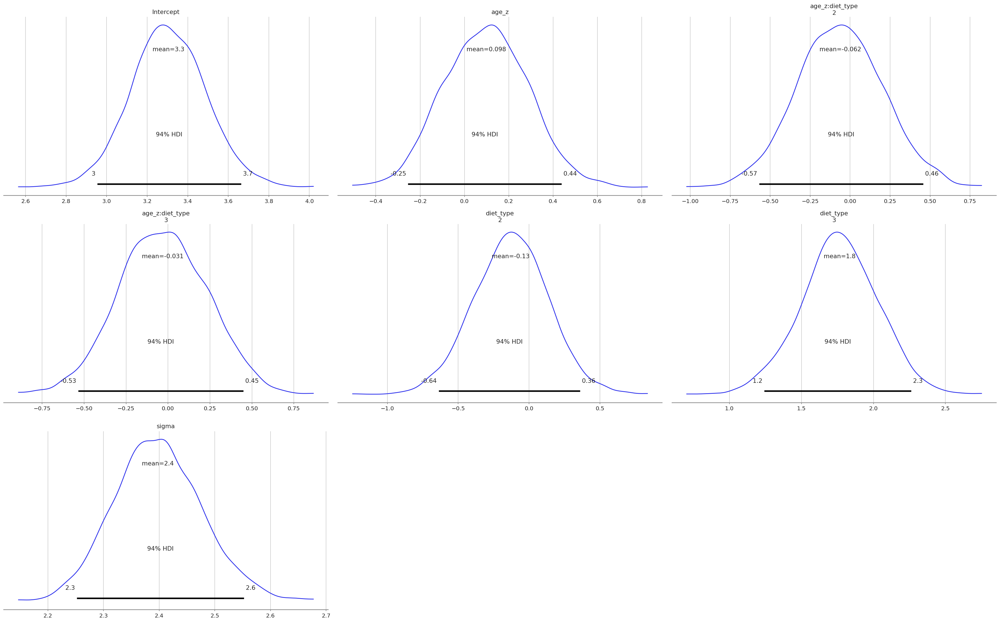

In [50]:
# ------------------------------------------------------------
# Posterior distributions
# ------------------------------------------------------------

az.plot_posterior(
    idata_bayes_age_diet_interaction,
    hdi_prob=HDI_MASS,
)

plt.tight_layout()
plt.show()

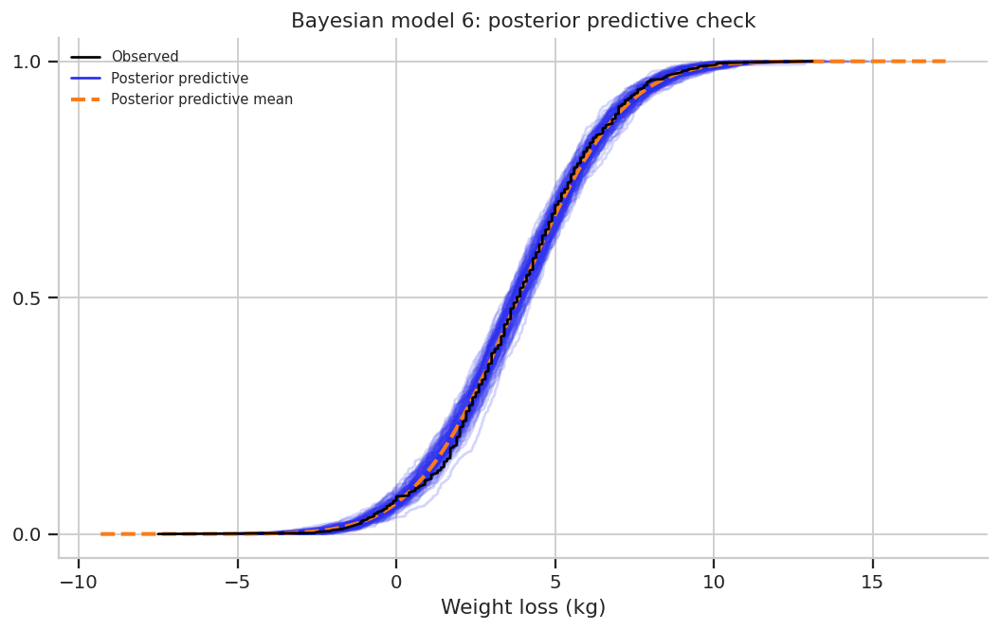

In [51]:
# ------------------------------------------------------------
# Posterior predictive check
# ------------------------------------------------------------

bayes_age_diet_interaction_model.predict(
    idata_bayes_age_diet_interaction,
    kind="pps",
    inplace=True,
    random_seed=RANDOM_SEED,
)

az.plot_ppc(
    idata_bayes_age_diet_interaction,
    group="posterior",
    kind='cumulative',
    observed=True,
    num_pp_samples=100,
)

plt.title("Bayesian model 6: posterior predictive check")
plt.xlabel("Weight loss (kg)")
plt.show()

/tmp/ipykernel_46430/326180247.py:33: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


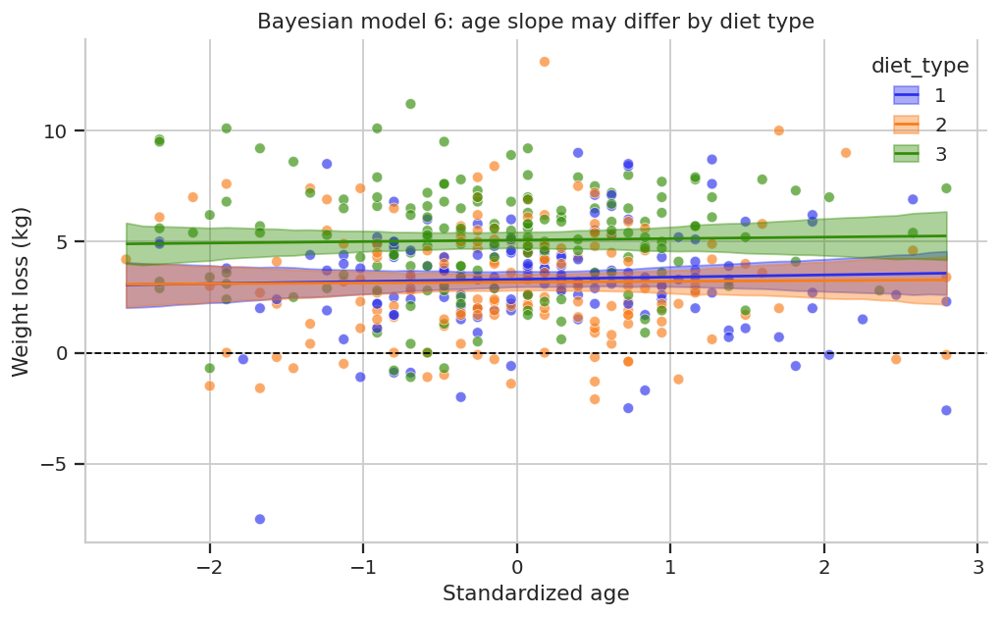

In [52]:
# ------------------------------------------------------------
# Bayesian prediction plot — Model 6
# Continuous by categorical interaction:
# weight_loss ~ age_z * diet_type
#
# This model allows the age slope to differ by diet type.
# ------------------------------------------------------------

try:
    fig, ax = plt.subplots(figsize=(8, 5))

    sns.scatterplot(
        data=food,
        x="age_z",
        y="weight_loss",
        hue="diet_type",
        ax=ax,
        alpha=0.65,
    )

    bmb.interpret.plot_predictions(
        bayes_age_diet_interaction_model,
        idata_bayes_age_diet_interaction,
        conditional=["age_z", "diet_type"],
        ax=ax,
    )

    ax.axhline(0, color="black", linestyle="--", linewidth=1)
    ax.set_title("Bayesian model 6: age slope may differ by diet type")
    ax.set_xlabel("Standardized age")
    ax.set_ylabel("Weight loss (kg)")

    plt.tight_layout()
    plt.show()

except Exception as error:
    print("Bayesian model 6 prediction plot was skipped:")
    print(error)

## 16. Bayesian model 7 — interaction

Formula:

```text
weight_loss ~ diet_type * gender
```

In [53]:
# ------------------------------------------------------------
# Bayesian model 7: categorical by categorical interaction
# ------------------------------------------------------------
# Model:
# weight_loss ~ diet_type * gender
#
# This is equivalent to:
# weight_loss ~ diet_type + gender + diet_type:gender
#
# Interpretation:
# - Intercept: expected weight loss for the reference diet type
#   and reference gender
# - diet_type coefficients: diet differences for the reference gender
# - gender coefficients: gender differences for the reference diet type
# - diet_type:gender coefficients: changes in the diet effect across genders
#
# This model asks whether the effect of diet type depends on gender.
# ------------------------------------------------------------

bayes_diet_gender_interaction_model = bmb.Model(
    "weight_loss ~ diet_type * gender",
    data=food,
)

print(bayes_diet_gender_interaction_model)

idata_bayes_diet_gender_interaction = bayes_diet_gender_interaction_model.fit(
    draws=1000,
    chains=4,
    random_seed=RANDOM_SEED,
    target_accept=0.9,
)

prior_bayes_diet_gender_interaction = bayes_diet_gender_interaction_model.prior_predictive(
    draws=1000,
    random_seed=RANDOM_SEED,
)


       Formula: weight_loss ~ diet_type * gender
        Family: gaussian
          Link: mu = identity
  Observations: 480
        Priors: 
    target = mu
        Common-level effects
            Intercept ~ Normal(mu: 3.8506, sigma: 11.6598)
            diet_type ~ Normal(mu: [0. 0.], sigma: [13.414 13.414])
            gender ~ Normal(mu: 0.0, sigma: 12.6468)
            diet_type:gender ~ Normal(mu: [0. 0.], sigma: [16.9675 16.9675])
        
        Auxiliary parameters
            sigma ~ HalfStudentT(nu: 4.0, sigma: 2.5294)


Output()

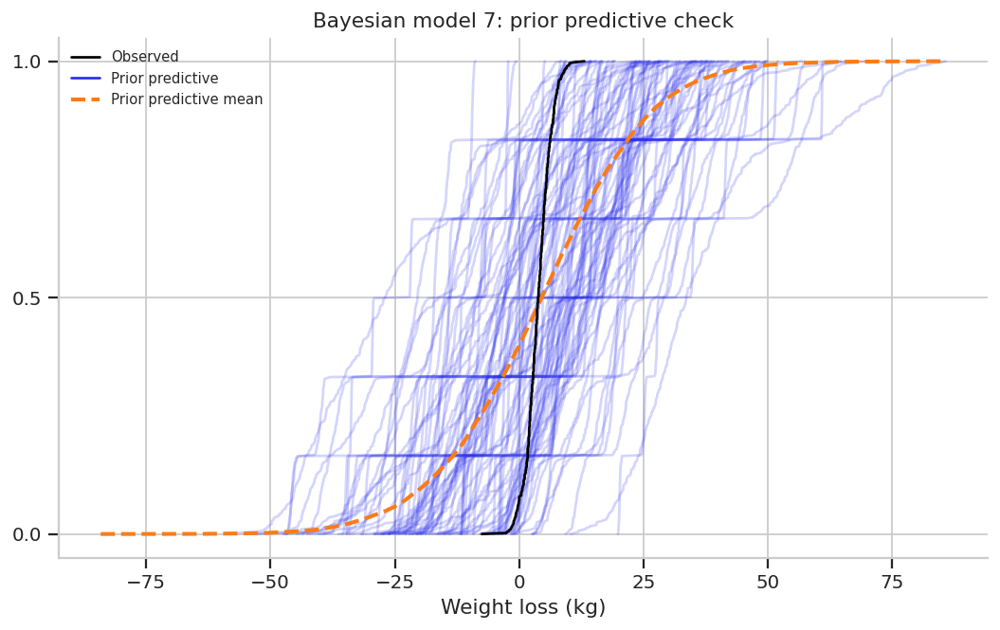

In [54]:
# ------------------------------------------------------------
# Prior predictive check
# ------------------------------------------------------------

az.plot_ppc(
    prior_bayes_diet_gender_interaction,
    group="prior",
    kind='cumulative',
    observed=True,
    num_pp_samples=100,
)

plt.title("Bayesian model 7: prior predictive check")
plt.xlabel("Weight loss (kg)")
plt.show()


Number of divergences in Bayesian model 7: categorical by categorical interaction: 0


/tmp/ipykernel_46430/4027936420.py:15: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


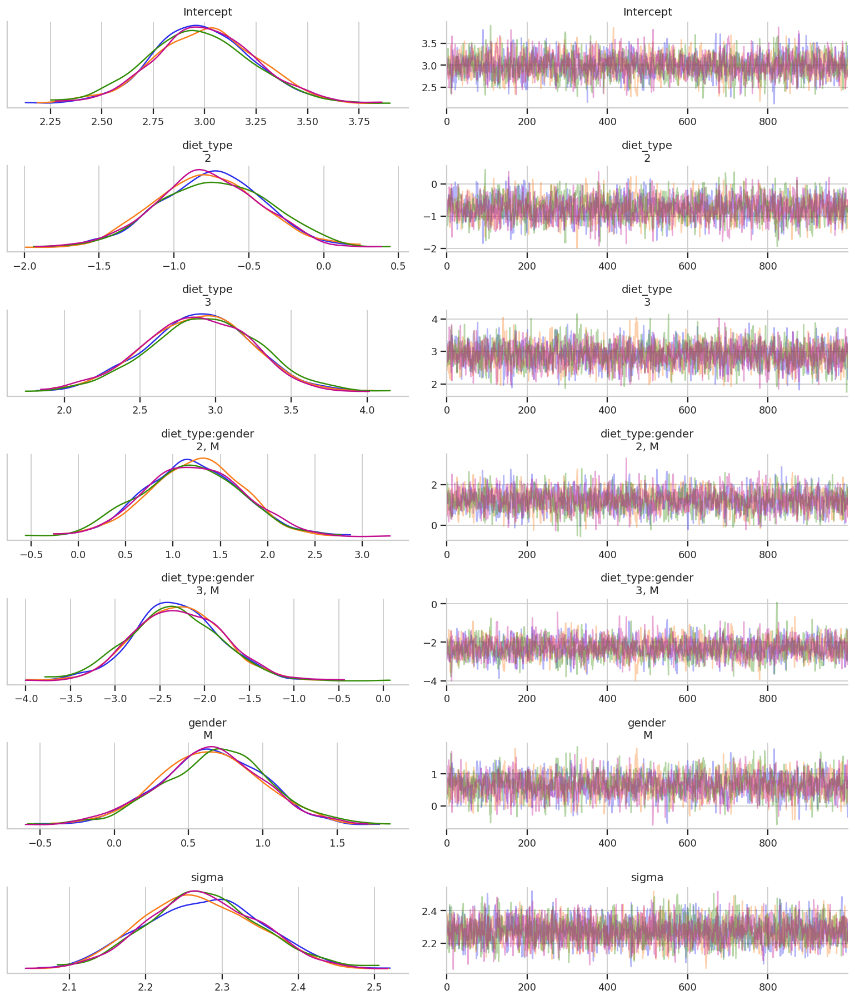

,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
Intercept,0.00,0.00,2160.0,2371.0,1.0
diet_type[2],0.01,0.00,2201.0,2501.0,1.0
diet_type[3],0.01,0.00,2195.0,2640.0,1.0
"diet_type:gender[2, M]",0.01,0.01,2207.0,2753.0,1.0
"diet_type:gender[3, M]",0.01,0.01,1971.0,2181.0,1.0
gender[M],0.01,0.00,1990.0,2314.0,1.0
sigma,0.00,0.00,3466.0,2965.0,1.0


In [55]:
# ------------------------------------------------------------
# Sampling diagnostics
# ------------------------------------------------------------

print_divergences(
    idata_bayes_diet_gender_interaction,
    "Bayesian model 7: categorical by categorical interaction",
)

az.plot_trace(
    idata_bayes_diet_gender_interaction,
    compact=False,
)

plt.tight_layout()
plt.show()

az.summary(
    idata_bayes_diet_gender_interaction,
    kind="diagnostics",
).round(2)


In [56]:
# ------------------------------------------------------------
# Posterior summary
# ------------------------------------------------------------

az.summary(
    idata_bayes_diet_gender_interaction,
    hdi_prob=HDI_MASS,
    kind="stats",
).round(3)


,mean,sd,hdi_3%,hdi_97%
Intercept,2.993,0.251,2.516,3.467
diet_type[2],-0.758,0.357,-1.456,-0.123
diet_type[3],2.892,0.357,2.204,3.546
"diet_type:gender[2, M]",1.216,0.508,0.242,2.122
"diet_type:gender[3, M]",-2.306,0.492,-3.194,-1.364
gender[M],0.659,0.352,-0.011,1.313
sigma,2.275,0.074,2.136,2.412


/tmp/ipykernel_46430/1481550316.py:10: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


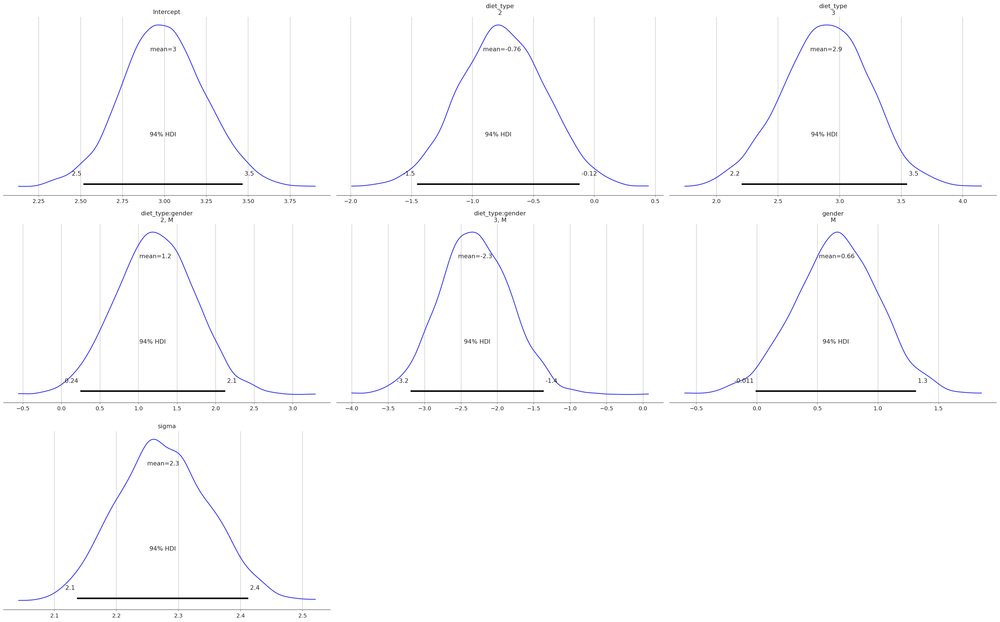

In [57]:
# ------------------------------------------------------------
# Posterior distributions
# ------------------------------------------------------------

az.plot_posterior(
    idata_bayes_diet_gender_interaction,
    hdi_prob=HDI_MASS,
)

plt.tight_layout()
plt.show()

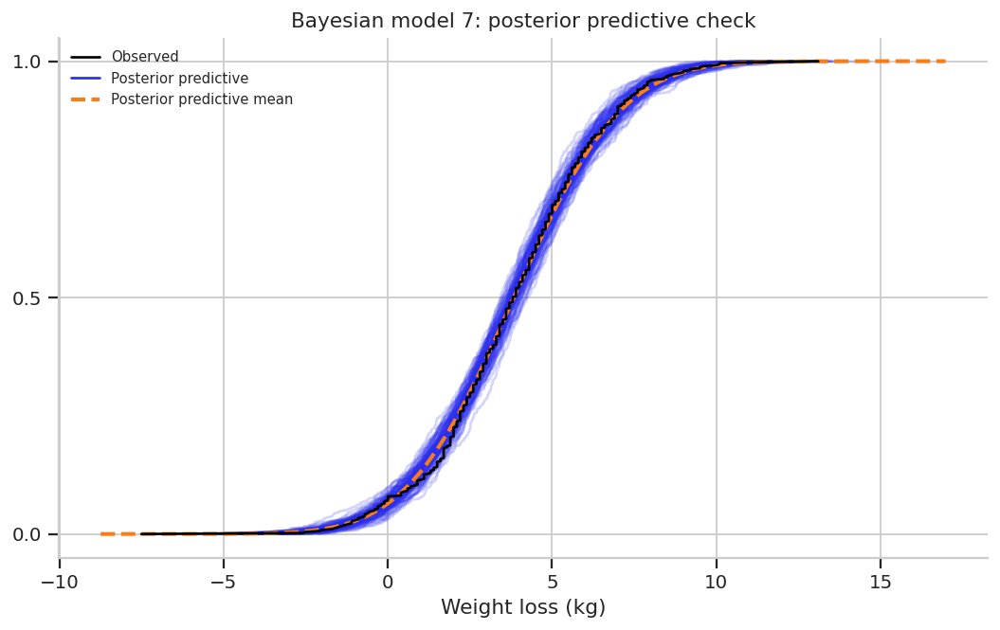

In [58]:
# ------------------------------------------------------------
# Posterior predictive check
# ------------------------------------------------------------

bayes_diet_gender_interaction_model.predict(
    idata_bayes_diet_gender_interaction,
    kind="pps",
    inplace=True,
    random_seed=RANDOM_SEED,
)

az.plot_ppc(
    idata_bayes_diet_gender_interaction,
    group="posterior",
    kind='cumulative',
    observed=True,
    num_pp_samples=100,
)

plt.title("Bayesian model 7: posterior predictive check")
plt.xlabel("Weight loss (kg)")
plt.show()

/tmp/ipykernel_46430/3924350573.py:35: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


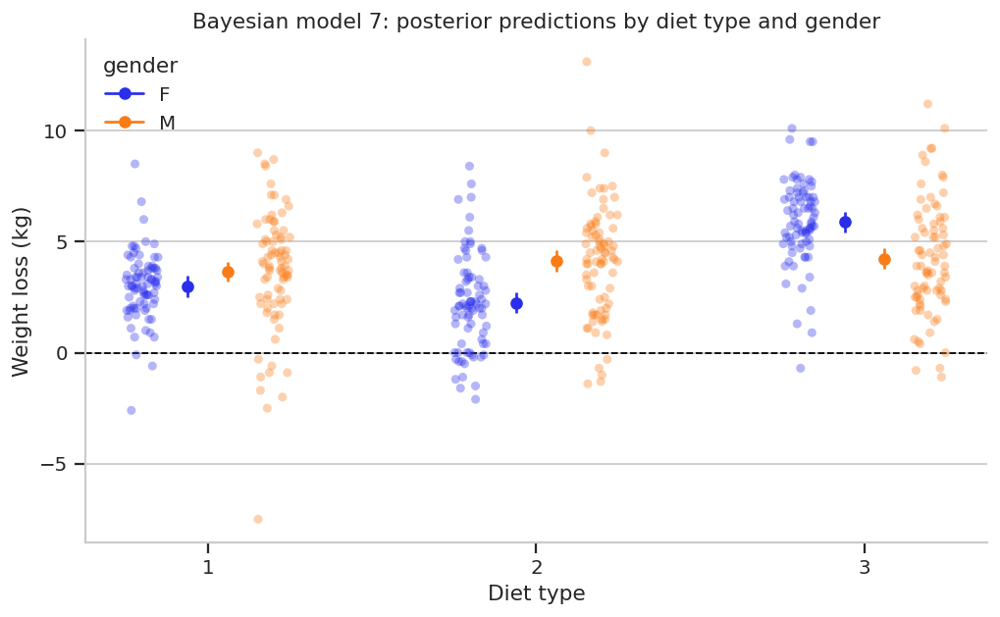

In [59]:

# ------------------------------------------------------------
# Bayesian prediction plot — Model 7
# Categorical by categorical interaction:
# weight_loss ~ diet_type * gender
#
# This model asks whether the diet effect differs by gender.
# ------------------------------------------------------------

try:
    fig, ax = plt.subplots(figsize=(8, 5))

    sns.stripplot(
        data=food,
        x="diet_type",
        y="weight_loss",
        hue="gender",
        dodge=True,
        alpha=0.35,
        jitter=True,
        ax=ax,
    )

    bmb.interpret.plot_predictions(
        bayes_diet_gender_interaction_model,
        idata_bayes_diet_gender_interaction,
        conditional=["diet_type", "gender"],
        ax=ax,
    )

    ax.axhline(0, color="black", linestyle="--", linewidth=1)
    ax.set_title("Bayesian model 7: posterior predictions by diet type and gender")
    ax.set_xlabel("Diet type")
    ax.set_ylabel("Weight loss (kg)")

    plt.tight_layout()
    plt.show()

except Exception as error:
    print("Bayesian model 7 prediction plot was skipped:")
    print(error)

## 17. Bayesian explained-variance and term-level effect-size summaries

In Bayesian analysis, explained-variance and effect-size measures are not single fixed numbers. They are calculated separately for each posterior draw.

For posterior draw $s$, the model contains one sampled set of parameters:

$$
\beta^{(s)}, \sigma^{(s)}
$$

From these parameters we calculate fitted means:

$$
\mu_i^{(s)}
$$

for every observation $i$.

Important: the Bayesian effect sizes in this section are calculated from posterior draws of $\mu$ and $\sigma$, not from posterior predictive draws $y^{rep}$. Posterior predictive draws are still useful for posterior predictive checks, but they are not used here to calculate effect sizes.


### 17.1 Bayesian $R^2$

Bayesian $R^2$ summarizes whole-model explained variation. For each posterior draw, we calculate

$$
V_{\mu}^{(s)} = \mathrm{Var}_i \left( \mu_i^{(s)} \right)
$$

$$
{R^2}^{(s)} = \frac{V_{\mu}^{(s)}}{V_{\mu}^{(s)} + {\sigma^2}^{(s)}}
$$

where:

- $\mu_i^{(s)}$ is the fitted mean for observation $i$ at draw $s$.

- $\sigma^{(s)}$ is the residual standard deviation at draw $s$.

This asks:

> What fraction of the modeled variation in weight loss is explained by the fitted mean structure?

The result is a posterior distribution of $R^2$ values. We summarize it with the mean and HDI.


### 17.2 Bayesian term-level partial $R^2$, $\eta^2$ and Cohen's $f$

For a specific model term $t$, we compare the full fitted mean to the fitted mean after removing only that term's contribution.

The full fitted mean is (as before):

$$
\mu_{i}^{(s)}

$$

The reduced fitted mean is:

$$
\mu_{-t,i}^{(s)}

$$

This is not a separately refitted reduced model. It is the same posterior draw, but with the selected term removed from the fitted mean.

The term contribution is:

$$
D_{t,i}^{(s)} =

\mu_{i}^{(s)} - \mu_{-t,i}^{(s)}

$$

We are interested in calculating the variance of this across data points:

$$
V_{t}^{(s)} = \mathrm{Var}_i \left( D_{t,i}^{(s)} \right)
$$

Bayesian term-level partial $R^2$ is:

$$
{R^{2}}^{(s)}_{\mathrm{partial},t} = 
\frac{V_{t}^{(s)}}
{V_{t}^{(s)} + {\sigma^2}^{(s)}}

$$

This asks:

> What fraction of the modeled variation in weight loss not explained by other variables can be explained by this term?

The result is a posterior distribution which we summarize it with the mean and HDI.

Bayesian $\eta^2$ is:

$$
{\eta^{2}}^{(s)} = 
\frac{V_{t}^{(s)}}
{V_{\mu}^{(s)} + {\sigma^2}^{(s)}}

$$

This asks:

> What is the fraction of the modeled variation in weight loss explained by this term out of the total variability in the data

Again, the result is a distribution.

Bayesian Cohen's $f$ is:

$$
{f^2}^{(s)} =
\frac{V_{t}^{(s)}}{{\sigma^2}^{(s)}}

$$

or equivalently

$$
f^{(s)} =

\frac{\mathrm{Std}_i(D_{t,i}^{(s)})}{\sigma^{(s)}}

$$

This asks:

> How large is the weight loss explained only by this term compared to the population variability.

The result is a posterior distribution

### Symbols used in this section

| Symbol             | Meaning                                                                                     |
| ------------------ | ------------------------------------------------------------------------------------------- |
| $s$                | One posterior draw. Each draw contains one sampled set of model parameters.                 |
| $\mu_{i}^{(s)}$    | The fitted mean for observation $i$ using the full model at draw $s$.                       |
| $\mu_{-t,i}^{(s)}$ | The fitted mean for observation $i$ after removing term $t$, using the same posterior draw. |
| $D_{t,i}^{(s)}$    | The contribution of term $t$: $\mu_{i}^{(s)} - \mu_{-t,i}^{(s)}$                            |
| $V_t^{(s)}$        | The variance of the contribution of term $t$ across data points                             |

Important: these are effect-size summaries. They help interpret magnitude, but they do not replace posterior predictive checks, diagnostics, or formal Bayesian model comparison.


In [60]:

# ------------------------------------------------------------
# Bayesian explained-variance and term-level effect-size helpers
# ------------------------------------------------------------
# These functions calculate Bayesian R2 and term-level effect sizes
# from posterior draws of mu and sigma.
# They do not use posterior predictive draws.
# ------------------------------------------------------------


def stack_posterior_array(idata, var_name):
    """Return posterior samples for one variable as a NumPy array.

    The first dimension is always sample = chain x draw.
    Remaining dimensions are coefficient dimensions, if present.
    """
    if var_name not in idata.posterior:
        available = list(idata.posterior.data_vars)
        raise KeyError(f"{var_name!r} was not found in posterior variables: {available}")

    values = (
        idata.posterior[var_name]
        .stack(sample=("chain", "draw"))
        .transpose("sample", ...)
        .values
    )
    return np.asarray(values)


def find_posterior_var(idata, candidates):
    """Find a posterior variable by exact name or by interaction components."""
    available = list(idata.posterior.data_vars)

    for name in candidates:
        if name in available:
            return name

    for name in candidates:
        parts = name.split(":")
        if len(parts) > 1:
            for var_name in available:
                if all(part in var_name for part in parts):
                    return var_name

    raise KeyError(f"Could not find any of {candidates}. Available variables: {available}")


def summarize_posterior_samples(samples, prefix):
    """Summarize a posterior sample vector with mean and HDI."""
    samples = np.asarray(samples, dtype=float)
    samples = samples[np.isfinite(samples)]

    if len(samples) == 0:
        return {
            f"mean_{prefix}": np.nan,
            f"hdi_low_{prefix}": np.nan,
            f"hdi_high_{prefix}": np.nan,
        }

    hdi = az.hdi(samples, hdi_prob=HDI_MASS)
    return {
        f"mean_{prefix}": float(np.mean(samples)),
        f"hdi_low_{prefix}": float(hdi[0]),
        f"hdi_high_{prefix}": float(hdi[1]),
    }


def posterior_sigma_samples(idata):
    sigma_name = find_posterior_var(idata, ["sigma"])
    sigma = stack_posterior_array(idata, sigma_name)
    return np.asarray(sigma).reshape(-1)


def posterior_scalar_samples(idata, var_name):
    actual_name = find_posterior_var(idata, [var_name])
    values = stack_posterior_array(idata, actual_name)
    return np.asarray(values).reshape(values.shape[0], -1)[:, 0]


def posterior_categorical_matrix(idata, var_name, levels):
    """Extract categorical coefficient samples as sample x level matrix."""
    actual_name = find_posterior_var(idata, [var_name])
    da = idata.posterior[actual_name]
    values = np.asarray(stack_posterior_array(idata, actual_name))

    if values.ndim == 1:
        values = values[:, None]
    elif values.ndim > 2:
        values = values.reshape(values.shape[0], -1)

    coord_labels = None
    coefficient_dims = [dim for dim in da.dims if dim not in ["chain", "draw"]]
    if len(coefficient_dims) == 1:
        dim = coefficient_dims[0]
        if dim in da.coords:
            coord_labels = [str(value) for value in da.coords[dim].values]

    if coord_labels is not None and len(coord_labels) == values.shape[1]:
        ordered_columns = []
        for level in levels:
            level_str = str(level)
            match_index = None
            for idx, label in enumerate(coord_labels):
                if label == level_str or label.endswith(level_str) or level_str in label:
                    match_index = idx
                    break
            if match_index is None:
                ordered_columns.append(np.zeros(values.shape[0]))
            else:
                ordered_columns.append(values[:, match_index])
        return np.column_stack(ordered_columns)

    if values.shape[1] < len(levels):
        padded = np.zeros((values.shape[0], len(levels)))
        padded[:, :values.shape[1]] = values
        return padded
    return values[:, :len(levels)]


def categorical_contribution(idata, var_name, series):
    categories = list(series.cat.categories)
    nonreference = categories[1:]
    coef = posterior_categorical_matrix(idata, var_name, nonreference)
    contribution = np.zeros((coef.shape[0], len(series)))
    observed = series.astype(str).to_numpy()

    for j, level in enumerate(nonreference):
        contribution += coef[:, [j]] * (observed == str(level))[None, :]

    return contribution


def continuous_contribution(idata, var_name, values):
    coef = posterior_scalar_samples(idata, var_name)
    x = np.asarray(values, dtype=float)
    return coef[:, None] * x[None, :]


def continuous_by_categorical_contribution(idata, interaction_name, x_values, category_series):
    categories = list(category_series.cat.categories)
    nonreference = categories[1:]
    coef = posterior_categorical_matrix(idata, interaction_name, nonreference)
    x = np.asarray(x_values, dtype=float)
    observed = category_series.astype(str).to_numpy()
    contribution = np.zeros((coef.shape[0], len(category_series)))

    for j, level in enumerate(nonreference):
        contribution += coef[:, [j]] * x[None, :] * (observed == str(level))[None, :]

    return contribution


def categorical_by_categorical_contribution(idata, interaction_name, first_series, second_series):
    first_categories = list(first_series.cat.categories)
    second_categories = list(second_series.cat.categories)
    first_nonreference = first_categories[1:]
    second_nonreference = second_categories[1:]

    reverse_name = ":".join(interaction_name.split(":")[::-1])
    actual_name = find_posterior_var(idata, [interaction_name, reverse_name])
    values = np.asarray(stack_posterior_array(idata, actual_name))

    if values.ndim == 1:
        values = values[:, None]
    else:
        values = values.reshape(values.shape[0], -1)

    combinations = [(a, b) for a in first_nonreference for b in second_nonreference]

    if values.shape[1] < len(combinations):
        padded = np.zeros((values.shape[0], len(combinations)))
        padded[:, :values.shape[1]] = values
        values = padded
    else:
        values = values[:, :len(combinations)]

    first_observed = first_series.astype(str).to_numpy()
    second_observed = second_series.astype(str).to_numpy()
    contribution = np.zeros((values.shape[0], len(first_series)))

    for j, (first_level, second_level) in enumerate(combinations):
        mask = (first_observed == str(first_level)) & (second_observed == str(second_level))
        contribution += values[:, [j]] * mask[None, :]

    return contribution


def model_term_contribution(idata, term):
    if term == "age_z":
        return continuous_contribution(idata, "age_z", food["age_z"].to_numpy())
    if term == "height_z":
        return continuous_contribution(idata, "height_z", food["height_z"].to_numpy())
    if term == "diet_type":
        return categorical_contribution(idata, "diet_type", food["diet_type"])
    if term == "gender":
        return categorical_contribution(idata, "gender", food["gender"])
    if term == "age_z:diet_type":
        return continuous_by_categorical_contribution(idata, "age_z:diet_type", food["age_z"].to_numpy(), food["diet_type"])
    if term == "diet_type:gender":
        return categorical_by_categorical_contribution(idata, "diet_type:gender", food["diet_type"], food["gender"])
    raise ValueError(f"Unknown term: {term}")


def posterior_mu_from_terms(idata, terms):
    intercept = posterior_scalar_samples(idata, "Intercept")
    mu = np.repeat(intercept[:, None], len(food), axis=1)
    for term in terms:
        mu += model_term_contribution(idata, term)
    return mu


def bayesian_r2_from_posterior(idata, terms):
    mu = posterior_mu_from_terms(idata, terms)
    sigma = posterior_sigma_samples(idata)
    v_mu = np.var(mu, axis=1, ddof=1)
    sigma_sq = sigma**2
    return v_mu / (v_mu + sigma_sq)


def bayesian_term_effect_sizes(idata, model_name, terms):
    sigma = posterior_sigma_samples(idata)
    sigma_sq = sigma**2
    mu = posterior_mu_from_terms(idata, terms)
    v_mu = np.var(mu, axis=1, ddof=1)
    rows = []

    for term in terms:
        d_term = model_term_contribution(idata, term)
        v_term = np.var(d_term, axis=1, ddof=1)
        partial_r2 = v_term / (v_term + sigma_sq)
        eta_sq = v_term / (v_mu + sigma_sq)
        cohens_f2 = v_term / sigma_sq
        cohens_f = np.sqrt(cohens_f2)
        row = {"model": model_name, "term": term}
        row.update(summarize_posterior_samples(eta_sq, "eta_sq"))
        row.update(summarize_posterior_samples(partial_r2, "partial_R2_term"))
        row.update(summarize_posterior_samples(cohens_f, "cohens_f"))
        rows.append(row)

    return pd.DataFrame(rows)

In [61]:
bayesian_model_specs = {
    "age": {"idata": idata_bayes_age, "terms": ["age_z"]},
    "diet": {"idata": idata_bayes_diet, "terms": ["diet_type"]},
    "age + height": {"idata": idata_bayes_age_height, "terms": ["age_z", "height_z"]},
    "diet + gender": {"idata": idata_bayes_diet_gender, "terms": ["diet_type", "gender"]},
    "age + diet": {"idata": idata_bayes_age_diet, "terms": ["age_z", "diet_type"]},
    "age * diet": {"idata": idata_bayes_age_diet_interaction, "terms": ["age_z", "diet_type", "age_z:diet_type"]},
    "diet * gender": {"idata": idata_bayes_diet_gender_interaction, "terms": ["diet_type", "gender", "diet_type:gender"]},
}

,model,mean_R2,hdi_low_R2,hdi_high_R2
0,age,0.002,0.000,0.007
1,diet,0.116,0.070,0.165
2,age + height,0.015,0.000,0.033
3,diet + gender,0.120,0.071,0.171
4,age + diet,0.118,0.070,0.171
5,age * diet,0.121,0.073,0.172
6,diet * gender,0.206,0.148,0.263


/tmp/ipykernel_46430/2991082701.py:35: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


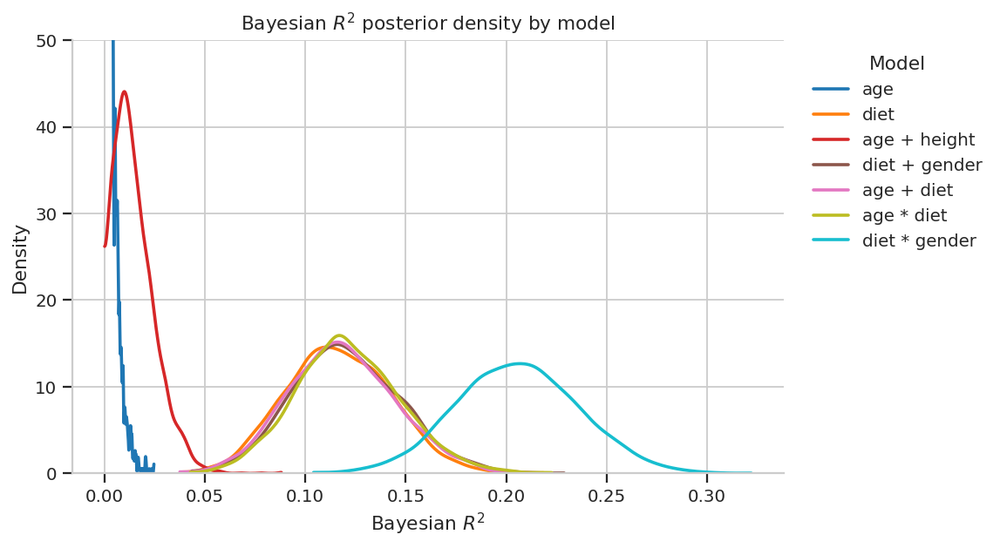

/tmp/ipykernel_46430/2991082701.py:49: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


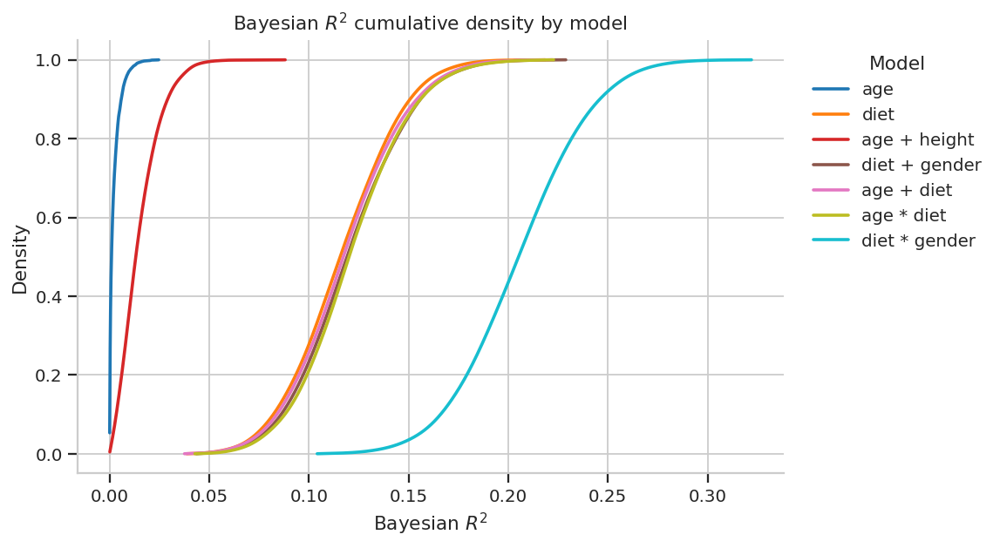

In [62]:

# ------------------------------------------------------------
# Bayesian R2 table
# ------------------------------------------------------------

r2_tables = []
r2_distributions = {}

for model_name, spec in bayesian_model_specs.items():
    try:
        r2 = bayesian_r2_from_posterior(spec["idata"], spec["terms"])
        r2_distributions[model_name] = r2
        row = {"model": model_name}
        row.update(summarize_posterior_samples(r2, "R2"))
        r2_tables.append(row)
    except Exception as error:
        print(f"Skipped Bayesian R2 for {model_name}:")
        print(error)

if len(r2_tables) > 0:
    bayes_r2_summary = pd.DataFrame(r2_tables)
    display(bayes_r2_summary.round(3))

    # Density view: where the posterior R2 draws concentrate for each model.
    plt.figure(figsize=(9, 5))
    r2_colors = plt.cm.tab10(np.linspace(0, 1, len(r2_distributions)))
    for (model_name, r2), color in zip(r2_distributions.items(), r2_colors):
        az.plot_dist(r2, kind="kde",
                     label=model_name, plot_kwargs={"color": color, "linewidth": 2})

    plt.ylim([0, 50])
    plt.xlabel(r"Bayesian $R^2$")
    plt.ylabel("Density")
    plt.title(r"Bayesian $R^2$ posterior density by model")
    plt.legend(title="Model", bbox_to_anchor=(1.02, 1), loc="upper left")
    plt.tight_layout()
    plt.show()

    # Cumulative view: for any R2 value x, the y-axis shows P(R2 <= x).
    plt.figure(figsize=(9, 5))

    for (model_name, r2), color in zip(r2_distributions.items(), r2_colors):
        az.plot_dist(r2, kind="kde", cumulative=True,
                     label=model_name, plot_kwargs={"color": color, "linewidth": 2})

    plt.xlabel(r"Bayesian $R^2$")
    plt.ylabel("Density")
    plt.title(r"Bayesian $R^2$ cumulative density by model")
    plt.legend(title="Model", bbox_to_anchor=(1.02, 1), loc="upper left")
    plt.tight_layout()
    plt.show()



In [63]:
# ------------------------------------------------------------
# Bayesian term-level effect-size table
# ------------------------------------------------------------

bayesian_effect_size_tables = []
for model_name, spec in bayesian_model_specs.items():
    try:
        bayesian_effect_size_tables.append(
            bayesian_term_effect_sizes(
                idata=spec["idata"],
                model_name=model_name,
                terms=spec["terms"],
            )
        )
    except Exception as error:
        print(f"Skipped Bayesian term-level effect sizes for {model_name}:")
        print(error)

if len(bayesian_effect_size_tables) > 0:
    bayesian_term_effect_sizes_summary = pd.concat(bayesian_effect_size_tables, ignore_index=True)
    display(bayesian_term_effect_sizes_summary.round(3))

,model,term,mean_eta_sq,hdi_low_eta_sq,hdi_high_eta_sq,mean_partial_R2_term,hdi_low_partial_R2_term,hdi_high_partial_R2_term,mean_cohens_f,hdi_low_cohens_f,hdi_high_cohens_f
0,age,age_z,0.002,0.000,0.007,0.002,0.000,0.007,0.037,0.000,0.086
1,diet,diet_type,0.116,0.070,0.165,0.116,0.070,0.165,0.361,0.274,0.445
2,age + height,age_z,0.002,0.000,0.007,0.002,0.000,0.007,0.036,0.000,0.086
3,age + height,height_z,0.013,0.000,0.031,0.013,0.000,0.031,0.106,0.020,0.193
4,diet + gender,diet_type,0.115,0.068,0.166,0.116,0.067,0.166,0.361,0.272,0.449
5,diet + gender,gender,0.005,0.000,0.015,0.006,0.000,0.017,0.064,0.000,0.132
6,age + diet,age_z,0.002,0.000,0.008,0.003,0.000,0.009,0.042,0.000,0.098
7,age + diet,diet_type,0.118,0.069,0.171,0.118,0.069,0.170,0.363,0.278,0.459
8,age * diet,age_z,0.007,0.000,0.024,0.008,0.000,0.027,0.071,0.000,0.166
9,age * diet,diet_type,0.117,0.070,0.170,0.118,0.070,0.170,0.364,0.278,0.456


# Part C — Frequentist modeling with OLS

We now keep the same model formulas but change the inferential framework.

In the frequentist block, coefficients are point estimates and uncertainty is summarized with standard errors, confidence intervals, t-statistics, and p-values.

Here, $R^2$ and related quantities are used only as explained-variance summaries. They should not be treated as the main method for model comparison.



## 18. Fit the same model structures with OLS

In [64]:
interaction_model = smf.ols("weight_loss ~ age_z * diet_type", data=food).fit()
print(interaction_model.summary())

                            OLS Regression Results                            
Dep. Variable:            weight_loss   R-squared:                       0.115
Model:                            OLS   Adj. R-squared:                  0.106
Method:                 Least Squares   F-statistic:                     12.34
Date:                Mon, 15 Jun 2026   Prob (F-statistic):           2.89e-11
Time:                        22:31:48   Log-Likelihood:                -1097.1
No. Observations:                 480   AIC:                             2206.
Df Residuals:                     474   BIC:                             2231.
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
Intercept                3.3072 

In [65]:

ols_formulas = {
    "one continuous": "weight_loss ~ age_z",
    "one categorical": "weight_loss ~ diet_type",
    "continuous + continuous": "weight_loss ~ age_z + height_z",
    "categorical + categorical": "weight_loss ~ diet_type + gender",
    "continuous + categorical": "weight_loss ~ age_z + diet_type",
    "continuous * categorical": "weight_loss ~ age_z * diet_type",
    "categorical * categorical": "weight_loss ~ diet_type * gender",
}

ols_models = {}
for model_name, formula in ols_formulas.items():
    print("=" * 80)
    print(model_name)
    print(formula)
    print("=" * 80)
    result = smf.ols(formula, data=food).fit()
    ols_models[model_name] = result
    print(result.summary())

one continuous
weight_loss ~ age_z
                            OLS Regression Results                            
Dep. Variable:            weight_loss   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                 -0.002
Method:                 Least Squares   F-statistic:                   0.03032
Date:                Mon, 15 Jun 2026   Prob (F-statistic):              0.862
Time:                        22:31:48   Log-Likelihood:                -1126.5
No. Observations:                 480   AIC:                             2257.
Df Residuals:                     478   BIC:                             2265.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      3.

## 19. Compact OLS summaries

For each OLS model, the fitted regression equation has the general form:

$$
y_i = \hat{y}_i + e_i
$$

where:

$$
e_i = y_i - \hat{y}_i
$$

Here:

- $y_i$ is the observed weight loss.
- $\hat{y}_i$ is the fitted value from the regression model.
- $e_i$ is the residual error.

The coefficient table reports:

$$
\hat{\beta}
$$

as the estimated coefficient, its standard error:

$$
SE(\hat{\beta})
$$

and the t-statistic:

$$
t =
\frac{\hat{\beta}}{SE(\hat{\beta})}
$$

The confidence interval is approximately:

$$
\hat{\beta}
\pm
t^* SE(\hat{\beta})
$$

where $t^*$ is the critical value from the t-distribution.

### Frequentist explained-variance summaries

The total variability in the outcome is:

$$
SS_{total} =
\sum_i (y_i - \bar{y})^2
$$

The residual unexplained variability is:

$$
SS_{residual} =
\sum_i (y_i - \hat{y}_i)^2
$$

The model-explained variability is:

$$
SS_{model} =
SS_{total} - SS_{residual}
$$

The coefficient of determination is:


$$
R^2 =
\frac{SS_{model}}{SS_{total}}
$$

Important: $R^2$ is a summary of explained variation. They are useful for interpretation, but they are not a complete model-comparison strategy.

In [66]:

def tidy_ols_results(result, model_name):
    conf_int = result.conf_int()
    table = pd.DataFrame({
        "model": model_name,
        "term": result.params.index,
        "estimate": result.params.values,
        "std_error": result.bse.values,
        "t_value": result.tvalues.values,
        "p_value": result.pvalues.values,
        "ci_low": conf_int.iloc[:, 0].values,
        "ci_high": conf_int.iloc[:, 1].values,
    })
    return table

ols_coefficients = pd.concat(
    [tidy_ols_results(result, model_name) for model_name, result in ols_models.items()],
    ignore_index=True,
)
display(ols_coefficients.round(4))

ols_fit_summary = pd.DataFrame({
    "model": list(ols_models.keys()),
    "formula": [ols_formulas[name] for name in ols_models.keys()],
    "R2": [model.rsquared for model in ols_models.values()],
    "df_model": [model.df_model for model in ols_models.values()],
    "df_resid": [model.df_resid for model in ols_models.values()],
})
display(ols_fit_summary.round(4))

,model,term,estimate,std_error,t_value,p_value,ci_low,ci_high
0,one continuous,Intercept,3.8506,0.1157,33.2849,0.0000,3.6233,4.0779
1,one continuous,age_z,-0.0202,0.1158,-0.1741,0.8618,-0.2477,0.2074
2,one categorical,Intercept,3.3219,0.1888,17.5976,0.0000,2.9510,3.6928
3,one categorical,diet_type[T.2],-0.1494,0.2670,-0.5595,0.5761,-0.6739,0.3752
4,one categorical,diet_type[T.3],1.7356,0.2670,6.5015,0.0000,1.2111,2.2602
5,continuous + continuous,Intercept,3.8506,0.1152,33.4348,0.0000,3.6243,4.0769
6,continuous + continuous,age_z,0.0021,0.1157,0.0179,0.9857,-0.2253,0.2294
7,continuous + continuous,height_z,-0.2668,0.1157,-2.3060,0.0215,-0.4941,-0.0395
8,categorical + categorical,Intercept,3.1746,0.2178,14.5769,0.0000,2.7467,3.6025
9,categorical + categorical,diet_type[T.2],-0.1494,0.2667,-0.5600,0.5757,-0.6735,0.3747


,model,formula,R2,df_model,df_resid
0,one continuous,weight_loss ~ age_z,0.0001,1.0,478.0
1,one categorical,weight_loss ~ diet_type,0.1144,2.0,477.0
2,continuous + continuous,weight_loss ~ age_z + height_z,0.0111,2.0,477.0
3,categorical + categorical,weight_loss ~ diet_type + gender,0.1178,3.0,476.0
4,continuous + categorical,weight_loss ~ age_z + diet_type,0.1151,3.0,476.0
5,continuous * categorical,weight_loss ~ age_z * diet_type,0.1152,5.0,474.0
6,categorical * categorical,weight_loss ~ diet_type * gender,0.2013,5.0,474.0


## 20. OLS prediction plots

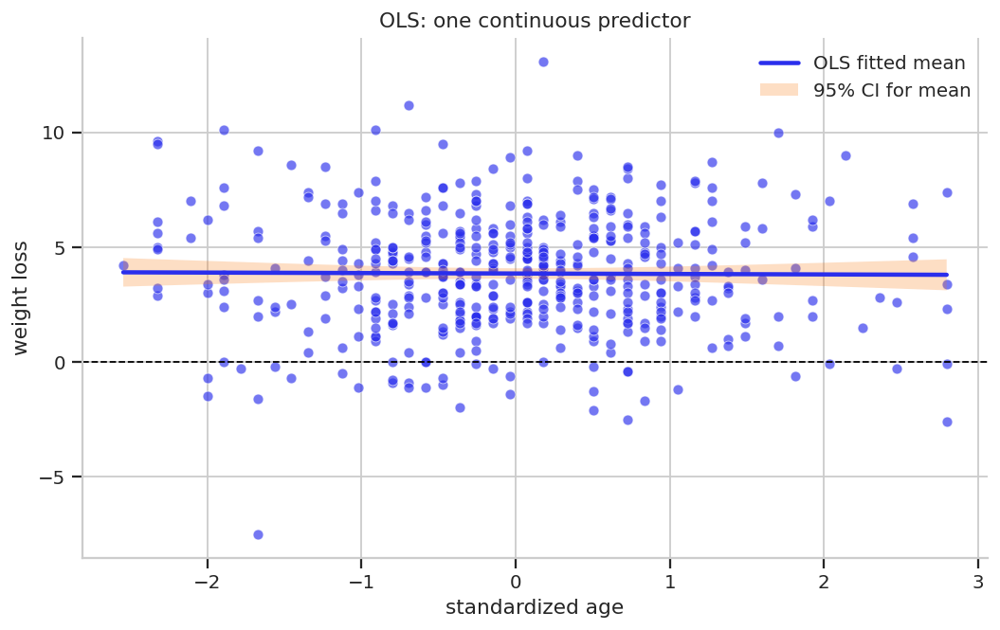

In [67]:
# ------------------------------------------------------------
# OLS prediction plot — Model 1
# One continues predictor:
# weight_loss ~ age_z
# ------------------------------------------------------------

fig, ax = plt.subplots(figsize=(8, 5))
sns.scatterplot(data=food, x="age_z", y="weight_loss", ax=ax, alpha=0.65)
x_grid = np.linspace(food["age_z"].min(), food["age_z"].max(), 100)
prediction_data = pd.DataFrame({"age_z": x_grid})
pred = ols_models["one continuous"].get_prediction(prediction_data).summary_frame(alpha=0.05)
ax.plot(x_grid, pred["mean"], linewidth=2.5, label="OLS fitted mean")
ax.fill_between(x_grid, pred["mean_ci_lower"], pred["mean_ci_upper"], alpha=0.25, label="95% CI for mean")
ax.axhline(0, color="black", linestyle="--", linewidth=1)
ax.set_title("OLS: one continuous predictor")
ax.set_xlabel("standardized age")
ax.set_ylabel("weight loss")
ax.legend()
plt.show()

/tmp/ipykernel_46430/3854474665.py:53: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


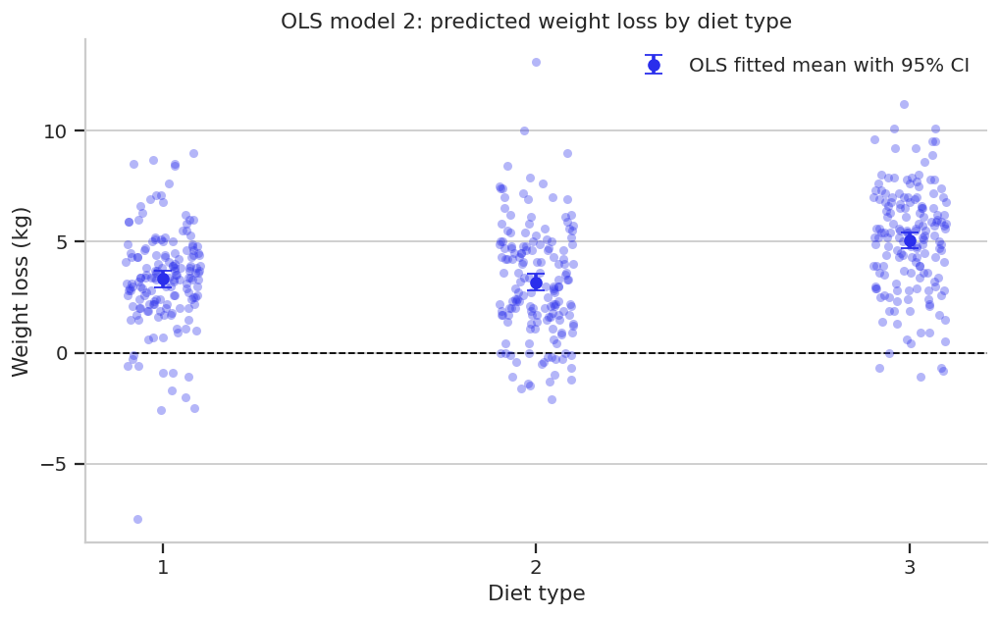

In [68]:
# ------------------------------------------------------------
# OLS prediction plot — Model 2
# One categorical predictor:
# weight_loss ~ diet_type
# ------------------------------------------------------------

prediction_data = pd.DataFrame({
    "diet_type": pd.Categorical(
        food["diet_type"].cat.categories,
        categories=food["diet_type"].cat.categories,
        ordered=True,
    )
})

pred = ols_models["one categorical"].get_prediction(
    prediction_data
).summary_frame(alpha=0.05)

prediction_data["predicted_mean"] = pred["mean"]
prediction_data["ci_low"] = pred["mean_ci_lower"]
prediction_data["ci_high"] = pred["mean_ci_upper"]

fig, ax = plt.subplots(figsize=(8, 5))

sns.stripplot(
    data=food,
    x="diet_type",
    y="weight_loss",
    alpha=0.35,
    jitter=True,
    ax=ax,
)

ax.errorbar(
    x=np.arange(len(prediction_data)),
    y=prediction_data["predicted_mean"],
    yerr=[
        prediction_data["predicted_mean"] - prediction_data["ci_low"],
        prediction_data["ci_high"] - prediction_data["predicted_mean"],
    ],
    fmt="o",
    capsize=5,
    linewidth=2,
    label="OLS fitted mean with 95% CI",
)

ax.axhline(0, color="black", linestyle="--", linewidth=1)
ax.set_title("OLS model 2: predicted weight loss by diet type")
ax.set_xlabel("Diet type")
ax.set_ylabel("Weight loss (kg)")
ax.legend()

plt.tight_layout()
plt.show()


/tmp/ipykernel_46430/2722748218.py:55: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


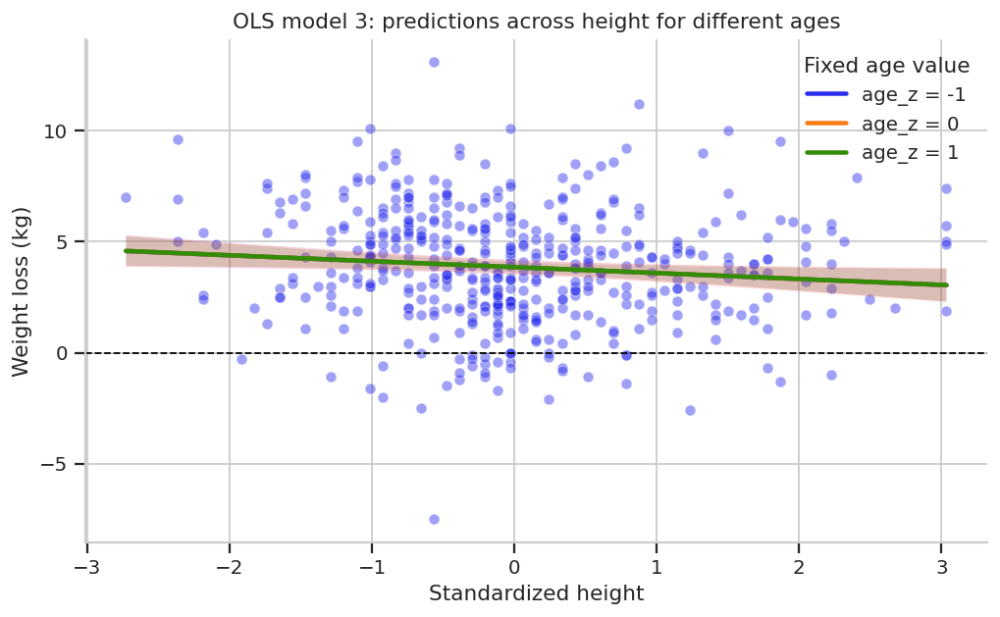

In [69]:
# ------------------------------------------------------------
# OLS prediction plot — Model 3
# Two continuous predictors:
# weight_loss ~ age_z + height_z
#
# The model uses both predictors.
# A 2D plot can show only one predictor on the x-axis,
# so we visualize slices of the fitted regression surface:
# predicted weight loss across height_z for selected fixed values of age_z.
# ------------------------------------------------------------

fig, ax = plt.subplots(figsize=(8, 5))

sns.scatterplot(
    data=food,
    x="height_z",
    y="weight_loss",
    ax=ax,
    alpha=0.45,
)

height_grid = np.linspace(food["height_z"].min(), food["height_z"].max(), 100)
age_values = [-1, 0, 1]

for age_value in age_values:
    pred_df = pd.DataFrame({
        "height_z": height_grid,
        "age_z": age_value,
    })

    pred = ols_models["continuous + continuous"].get_prediction(
        pred_df
    ).summary_frame(alpha=0.05)

    ax.plot(
        height_grid,
        pred["mean"],
        linewidth=2.5,
        label=f"age_z = {age_value}",
    )

    ax.fill_between(
        height_grid,
        pred["mean_ci_lower"],
        pred["mean_ci_upper"],
        alpha=0.15,
    )

ax.axhline(0, color="black", linestyle="--", linewidth=1)
ax.set_title("OLS model 3: predictions across height for different ages")
ax.set_xlabel("Standardized height")
ax.set_ylabel("Weight loss (kg)")
ax.legend(title="Fixed age value")

plt.tight_layout()
plt.show()


/tmp/ipykernel_46430/1502741839.py:90: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


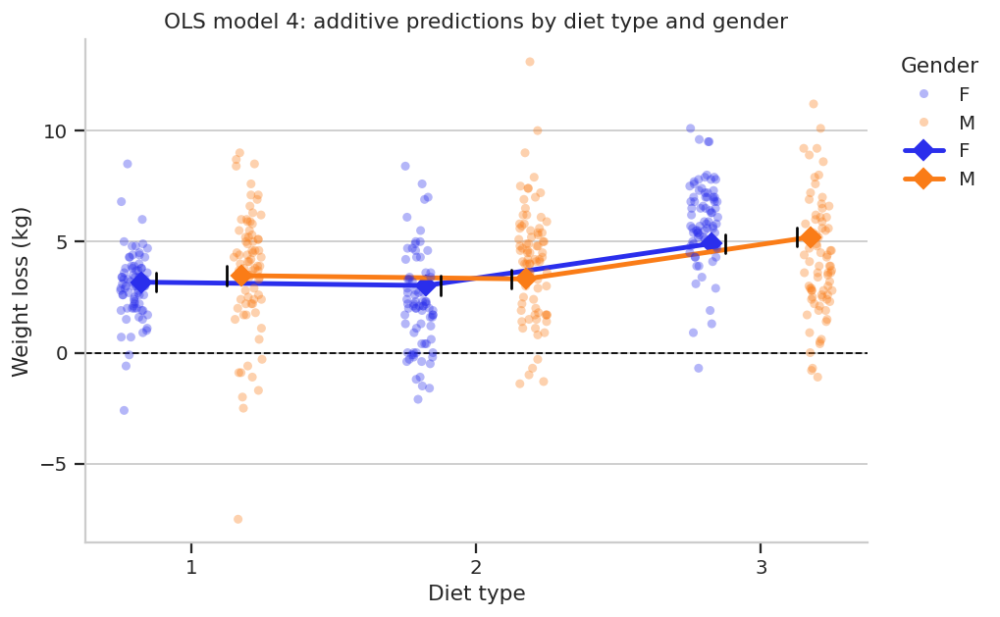

In [70]:
# ------------------------------------------------------------
# OLS prediction plot — Model 4
# Two categorical predictors, additive model:
# weight_loss ~ diet_type + gender
#
# This model estimates diet and gender effects additively.
# The diet difference is assumed to be the same across genders.
# ------------------------------------------------------------

prediction_rows = []

for diet in food["diet_type"].cat.categories:
    for gender_value in food["gender"].cat.categories:
        prediction_rows.append({
            "diet_type": diet,
            "gender": gender_value,
        })

prediction_data = pd.DataFrame(prediction_rows)

prediction_data["diet_type"] = pd.Categorical(
    prediction_data["diet_type"],
    categories=food["diet_type"].cat.categories,
    ordered=True,
)

prediction_data["gender"] = pd.Categorical(
    prediction_data["gender"],
    categories=food["gender"].cat.categories,
    ordered=True,
)

pred = ols_models["categorical + categorical"].get_prediction(
    prediction_data
).summary_frame(alpha=0.05)

prediction_data["predicted_mean"] = pred["mean"]
prediction_data["ci_low"] = pred["mean_ci_lower"]
prediction_data["ci_high"] = pred["mean_ci_upper"]

fig, ax = plt.subplots(figsize=(8, 5))

sns.stripplot(
    data=food,
    x="diet_type",
    y="weight_loss",
    hue="gender",
    dodge=True,
    alpha=0.35,
    jitter=True,
    ax=ax,
)

sns.pointplot(
    data=prediction_data,
    x="diet_type",
    y="predicted_mean",
    hue="gender",
    dodge=0.35,
    errorbar=None,
    markers="D",
    linestyles="-",
    ax=ax,
)

# Add confidence intervals manually
diet_levels = list(food["diet_type"].cat.categories)
gender_levels = list(food["gender"].cat.categories)

for _, row in prediction_data.iterrows():
    diet_index = diet_levels.index(row["diet_type"])
    gender_index = gender_levels.index(row["gender"])

    shift = (gender_index - (len(gender_levels) - 1) / 2) * 0.25
    x_position = diet_index + shift

    ax.plot(
        [x_position, x_position],
        [row["ci_low"], row["ci_high"]],
        color="black",
        linewidth=1.5,
    )

ax.axhline(0, color="black", linestyle="--", linewidth=1)
ax.set_title("OLS model 4: additive predictions by diet type and gender")
ax.set_xlabel("Diet type")
ax.set_ylabel("Weight loss (kg)")
ax.legend(title="Gender", bbox_to_anchor=(1.02, 1), loc="upper left")

plt.tight_layout()
plt.show()

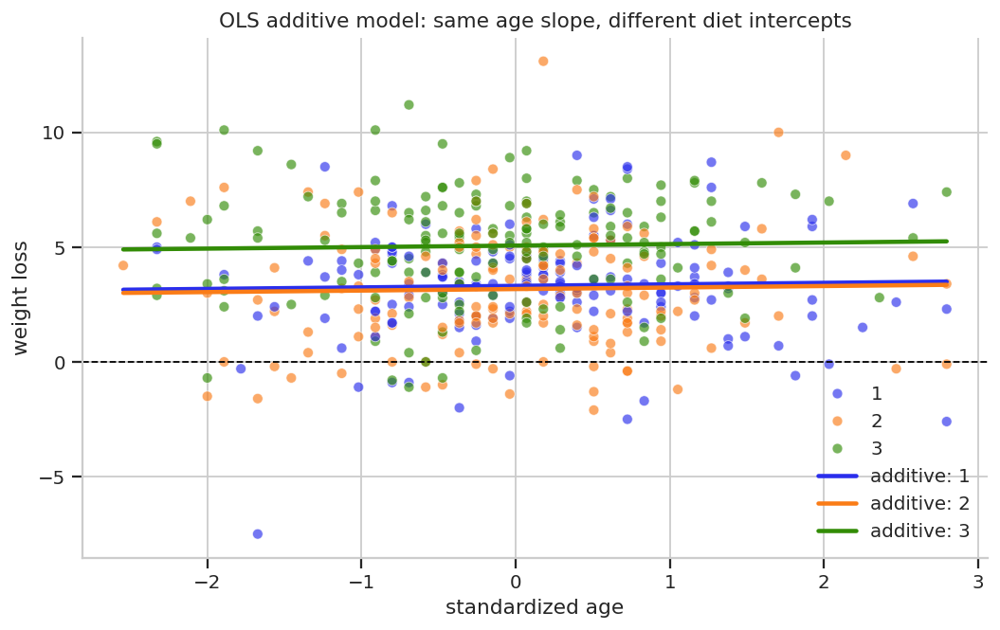

In [71]:
# ------------------------------------------------------------
# OLS prediction plot — Model 5
# continuous + categorical predictors, additive model:
# weight_loss ~ diet_type + age_z
#
# This model estimates diet and age_z effects additively.
# The diet difference is assumed to be the same across ages.
# ------------------------------------------------------------
fig, ax = plt.subplots(figsize=(8, 5))
sns.scatterplot(data=food, x="age_z", y="weight_loss", hue="diet_type", ax=ax, alpha=0.65)
age_grid = np.linspace(food["age_z"].min(), food["age_z"].max(), 100)
for diet in food["diet_type"].cat.categories:
    pred_df = pd.DataFrame({
        "age_z": age_grid,
        "diet_type": pd.Categorical([diet] * len(age_grid), categories=food["diet_type"].cat.categories, ordered=True),
    })
    pred = ols_models["continuous + categorical"].get_prediction(pred_df).summary_frame(alpha=0.05)
    ax.plot(age_grid, pred["mean"], linewidth=2.5, label=f"additive: {diet}")
ax.axhline(0, color="black", linestyle="--", linewidth=1)
ax.set_title("OLS additive model: same age slope, different diet intercepts")
ax.set_xlabel("standardized age")
ax.set_ylabel("weight loss")
ax.legend()
plt.show()


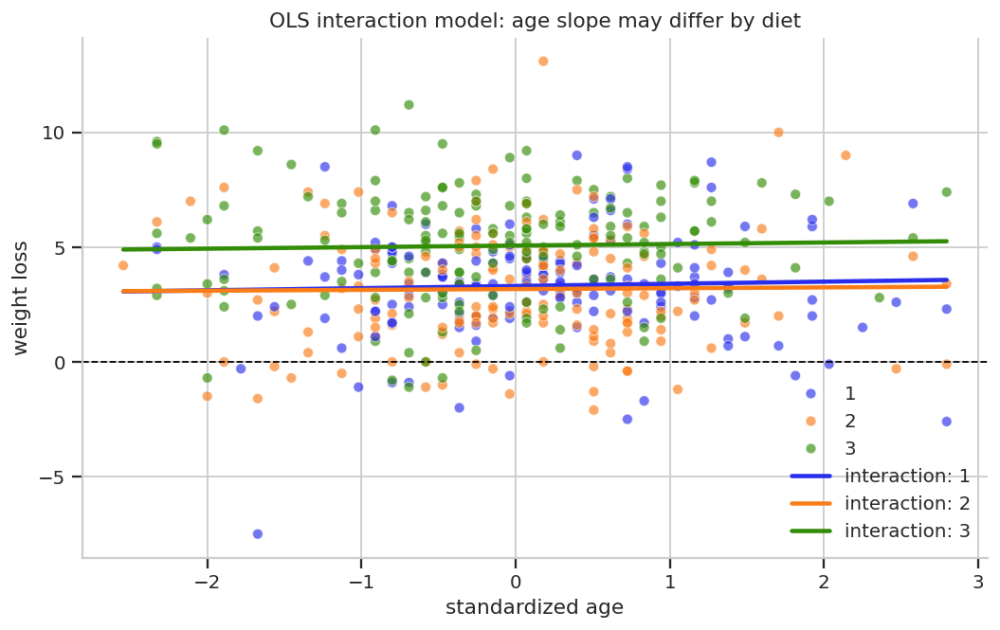

In [72]:
# ------------------------------------------------------------
# OLS prediction plot — Model 6
# continuous and categorical interaction:
# weight_loss ~ diet_type * age_z
#
# This model allows the diet effect to differ by age.
# ------------------------------------------------------------
fig, ax = plt.subplots(figsize=(8, 5))
sns.scatterplot(data=food, x="age_z", y="weight_loss", hue="diet_type", ax=ax, alpha=0.65)
age_grid = np.linspace(food["age_z"].min(), food["age_z"].max(), 100)
for diet in food["diet_type"].cat.categories:
    pred_df = pd.DataFrame({
        "age_z": age_grid,
        "diet_type": pd.Categorical([diet] * len(age_grid), categories=food["diet_type"].cat.categories, ordered=True),
    })
    pred = ols_models["continuous * categorical"].get_prediction(pred_df).summary_frame(alpha=0.05)
    ax.plot(age_grid, pred["mean"], linewidth=2.5, label=f"interaction: {diet}")
ax.axhline(0, color="black", linestyle="--", linewidth=1)
ax.set_title("OLS interaction model: age slope may differ by diet")
ax.set_xlabel("standardized age")
ax.set_ylabel("weight loss")
ax.legend()
plt.show()


/tmp/ipykernel_46430/2891319105.py:89: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


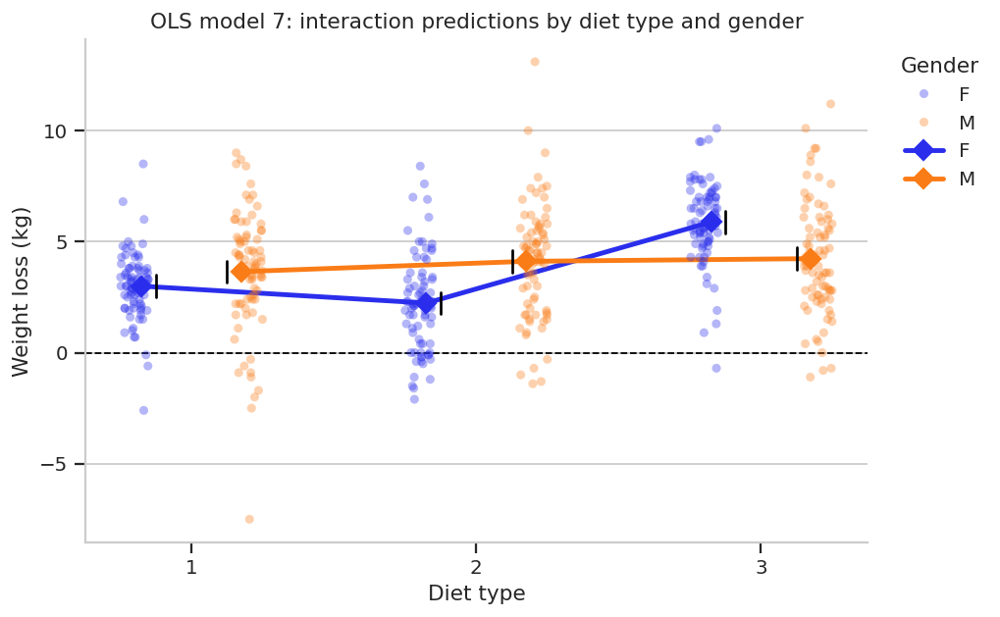

In [73]:
# ------------------------------------------------------------
# OLS prediction plot — Model 7
# Categorical by categorical interaction:
# weight_loss ~ diet_type * gender
#
# This model allows the diet effect to differ by gender.
# ------------------------------------------------------------

prediction_rows = []

for diet in food["diet_type"].cat.categories:
    for gender_value in food["gender"].cat.categories:
        prediction_rows.append({
            "diet_type": diet,
            "gender": gender_value,
        })

prediction_data = pd.DataFrame(prediction_rows)

prediction_data["diet_type"] = pd.Categorical(
    prediction_data["diet_type"],
    categories=food["diet_type"].cat.categories,
    ordered=True,
)

prediction_data["gender"] = pd.Categorical(
    prediction_data["gender"],
    categories=food["gender"].cat.categories,
    ordered=True,
)

pred = ols_models["categorical * categorical"].get_prediction(
    prediction_data
).summary_frame(alpha=0.05)

prediction_data["predicted_mean"] = pred["mean"]
prediction_data["ci_low"] = pred["mean_ci_lower"]
prediction_data["ci_high"] = pred["mean_ci_upper"]

fig, ax = plt.subplots(figsize=(8, 5))

sns.stripplot(
    data=food,
    x="diet_type",
    y="weight_loss",
    hue="gender",
    dodge=True,
    alpha=0.35,
    jitter=True,
    ax=ax,
)

sns.pointplot(
    data=prediction_data,
    x="diet_type",
    y="predicted_mean",
    hue="gender",
    dodge=0.35,
    errorbar=None,
    markers="D",
    linestyles="-",
    ax=ax,
)

# Add confidence intervals manually
diet_levels = list(food["diet_type"].cat.categories)
gender_levels = list(food["gender"].cat.categories)

for _, row in prediction_data.iterrows():
    diet_index = diet_levels.index(row["diet_type"])
    gender_index = gender_levels.index(row["gender"])

    shift = (gender_index - (len(gender_levels) - 1) / 2) * 0.25
    x_position = diet_index + shift

    ax.plot(
        [x_position, x_position],
        [row["ci_low"], row["ci_high"]],
        color="black",
        linewidth=1.5,
    )

ax.axhline(0, color="black", linestyle="--", linewidth=1)
ax.set_title("OLS model 7: interaction predictions by diet type and gender")
ax.set_xlabel("Diet type")
ax.set_ylabel("Weight loss (kg)")
ax.legend(title="Gender", bbox_to_anchor=(1.02, 1), loc="upper left")

plt.tight_layout()
plt.show()

# Part D — ANOVA as a regression summary

ANOVA-style summaries decompose variation in the outcome.

- Regression coefficient tables focus on individual parameters.
- ANOVA-style tables focus on model terms and explained variation.

In this tutorial we use ANOVA mainly to connect categorical regression models to sums of squares and term-level effect-size measures. We do not use nested-model partial $R^2$ in this version of the tutorial.



## 21. ANOVA helper functions

We use Type II sums of squares for the teaching examples. In unbalanced designs, different sums-of-squares types can give different answers, especially with interactions.

### ANOVA-style sums of squares

For each model term:

$$
SS_{term}
$$

is the amount of variation attributed to that term.

The total sum of squares is:

$$
SS_{total} =
\sum_i (y_i - \bar{y})^2
$$

The residual sum of squares is:

$$
SS_{residual} =
\sum_i (y_i - \hat{y}_i)^2
$$

### Effect-size measures for ANOVA terms

Eta squared measures the proportion of total variation associated with a model term:

$$
\eta^2 =
\frac{SS_{term}}{SS_{total}}
$$

A partial $R^2$-style quantity measures the size of a term relative to that term plus residual variation:

$$
R^2_{partial, term} =
\frac{SS_{term}}{SS_{term} + SS_{residual}}
$$

Cohen's $f$ measures the size of a term relative to residual variation:

$$
f =
\frac{\sqrt{SS_{term}}}{\sqrt{SS_{residual}}}
$$


These effect sizes describe magnitude. They should be interpreted together with the model assumptions, uncertainty, and scientific context.

In [74]:

def anova_with_effect_sizes(result, model_name, typ=2):
    table = anova_lm(result, typ=typ).copy()
    table = table.rename(columns={"sum_sq": "SS", "df": "df"})

    ss_total = np.sum((result.model.endog - np.mean(result.model.endog)) ** 2)
    ss_residual = table.loc["Residual", "SS"] if "Residual" in table.index else result.ssr

    table["eta_sq"] = table["SS"] / ss_total
    table["partial_R2_term"] = table["SS"] / (table["SS"] + ss_residual)
    table["cohens_f"] = np.sqrt(table["SS"] / ss_residual)

    # The raw ANOVA output may include F-statistics and p-values.
    # They are not emphasized in this tutorial, so we keep the table focused
    # on sums of squares and effect-size summaries.
    columns_to_keep = [col for col in ["SS", "df", "eta_sq", "partial_R2_term", "cohens_f"] if col in table.columns]
    table = table[columns_to_keep]

    if "Residual" in table.index:
        table.loc["Residual", ["eta_sq", "partial_R2_term", "cohens_f"]] = np.nan

    table.insert(0, "model", model_name)
    table.insert(1, "term", table.index)
    table = table.reset_index(drop=True)
    return table

def display_anova_table(result, model_name, typ=2):
    table = anova_with_effect_sizes(result, model_name=model_name, typ=typ)
    display(table.round(4))
    return table

## 22. One-way ANOVA

Regression formula:

```text
weight_loss ~ diet_type
```

Question: does diet type explain variation in weight loss?

In [75]:

anova_one_way = display_anova_table(
    ols_models["one categorical"],
    model_name="one-way ANOVA: diet type",
    typ=2,
)

,model,term,SS,df,eta_sq,partial_R2_term,cohens_f
0,one-way ANOVA: diet type,diet_type,351.3564,2.0,0.1144,0.1144,0.3594
1,one-way ANOVA: diet type,Residual,2719.5434,477.0,NaN,NaN,NaN


## 23. Two-way additive ANOVA

Regression formula:

```text
weight_loss ~ diet_type + gender
```

In [76]:

anova_two_way_additive = display_anova_table(
    ols_models["categorical + categorical"],
    model_name="two-way additive ANOVA: diet type + gender",
    typ=2,
)

,model,term,SS,df,eta_sq,partial_R2_term,cohens_f
0,two-way additive ANOVA: diet type + gender,diet_type,351.3564,2.0,0.1144,0.1148,0.3601
1,two-way additive ANOVA: diet type + gender,gender,10.4135,1.0,0.0034,0.0038,0.0620
2,two-way additive ANOVA: diet type + gender,Residual,2709.1299,476.0,NaN,NaN,NaN


## 24. Two-way ANOVA with interaction

Regression formula:

```text
weight_loss ~ diet_type * gender
```

Equivalent structure:

```text
weight_loss ~ diet_type + gender + diet_type:gender
```

When an interaction is included, main effects must be interpreted carefully.

In [77]:

anova_two_way_interaction = display_anova_table(
    ols_models["categorical * categorical"],
    model_name="two-way ANOVA with interaction: diet type * gender",
    typ=2,
)

,model,term,SS,df,eta_sq,partial_R2_term,cohens_f
0,two-way ANOVA with interaction: diet type * ge...,diet_type,351.3564,2.0,0.1144,0.1253,0.3785
1,two-way ANOVA with interaction: diet type * ge...,gender,10.4135,1.0,0.0034,0.0042,0.0652
2,two-way ANOVA with interaction: diet type * ge...,diet_type:gender,256.4978,2.0,0.0835,0.0947,0.3234
3,two-way ANOVA with interaction: diet type * ge...,Residual,2452.6321,474.0,NaN,NaN,NaN


# Part E — Final synthesis

## Final model map

| Formula | Predictor types | Model assumption | Typical question |
|---|---|---|---|
| `weight_loss ~ age_z` | one continuous | one linear slope | Does expected weight loss change with age? |
| `weight_loss ~ diet_type` | one categorical | each diet has a mean | Do diets differ in average weight loss? |
| `weight_loss ~ age_z + height_z` | two continuous | additive slopes | Does each predictor explain weight loss adjusted for the other? |
| `weight_loss ~ diet_type + gender` | two categorical | additive group effects | Do diet and gender explain weight loss? |
| `weight_loss ~ age_z + diet_type` | continuous + categorical | same slope, different intercepts | Does diet explain weight loss after accounting for age? |
| `weight_loss ~ age_z * diet_type` | continuous × categorical | age slope can differ by diet | Does the age effect depend on diet type? |
| `weight_loss ~ diet_type * gender` | categorical × categorical | diet differences can depend on gender | Does diet effectiveness differ by gender? |

## Take-home messages

1. Regression models differ mainly in how they define $\mu_i$.
2. Continuous predictors enter through slopes.
3. Categorical predictors enter through indicator variables and reference categories.
4. Additive models assume that predictors contribute separately.
5. Interaction models allow the effect of one predictor to depend on another predictor.
6. ANOVA-style summaries decompose variation by model terms, especially in models with categorical predictors.
7. Explained-variance summaries describe magnitude, not definitive model quality.
8. Bayesian and frequentist models can use the same formula, but their interpretations are different.

### Frequentist explained-variance and effect-size measures

| Measure | Formula | Main question |
|---|---|---|
| $R^2$ | $R^2=\frac{SS_{model}}{SS_{tot}}$ | How much total variation does the whole model explain? |
| Term-level partial $R^2$ | $R^2_{partial,term}=\frac{SS_{term}}{SS_{term}+SS_{res}}$ | How large is a specific term relative to that term plus residual variation? |
| $\eta^2$ | $\eta^2=\frac{SS_{term}}{SS_{tot}}$ | What proportion of total variation is associated with a specific term? |
| Cohen's $f$ | $f=\frac{\sqrt{SS_{term}}}{\sqrt{SS_{res}}}$ | How large is the term contribution relative to residual variation? |

### Bayesian explained-variance and effect-size measures

| Measure | Formula | Main question |
|---|---|---|
| Bayesian $R^2$ | $R_s^2=\frac{V_{\mu}^{(s)}}{V_{\mu}^{(s)}+{\sigma^2}^{(s)}}$ | How much modeled variation is explained by the fitted mean structure? |
| Bayesian term-level partial $R^2$ | ${R^{2}}^{(s)}_{\mathrm{partial},t}=\frac{V_t^{(s)}}{V_t^{(s)}+{\sigma^2}^{(s)}}$ | How large is a specific term relative to that term plus residual variation? |
| Bayesian $\eta^2$ | ${\eta^2}^{(s)}=\frac{V_t^{(s)}}{V_{\mu}^{(s)}+{\sigma^2}^{(s)}}$ | What fraction of total modeled-plus-residual variation is associated with a specific term? |
| Bayesian Cohen's $f$ | $f^{(s)}=\sqrt{\frac{V_t^{(s)}}{{\sigma^2}^{(s)}}}$ | How large is the term contribution relative to residual variation? |

The frequentist quantities are calculated from one fitted OLS model and ANOVA-style sums of squares. The Bayesian quantities are calculated separately for every posterior draw from fitted means $\mu^{(s)}$, term contributions $D_t^{(s)}$, and residual variance ${\sigma^2}^{(s)}$.

These measures describe magnitude. They should be interpreted together with model assumptions, uncertainty, diagnostics, and the scientific context.

Do not use $R^2$ as the main method for model comparison. A model with a larger $R^2$ can still be a worse scientific or predictive model if it overfits, violates assumptions, or answers the wrong question.